# Figures for manuscript

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2
import logging
import os
import pathlib
import pickle
import string

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import pygmt
import seaborn as sns
import verde as vd
import xarray as xr
import xrft
from polartoolkit import fetch, maps, profiles
from polartoolkit import utils as polar_utils

sns.set_theme()

from synthetic_bathymetry_inversion import ice_shelf_stats, synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import plotting, utils
from invert4geom import synthetic as inv_synthetic

In [2]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

plot_region = inversion_region

true_density_contrast = 1476

bathymetry, basement, _ = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
    plot_topography=False,
    plot_gravity=False,
)

buffer_region = polar_utils.get_grid_info(bathymetry)[1]

# clip to plot region
bathymetry = bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
basement = basement.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

INFO:polartoolkit:changing grid region, spacing and/or registration
INFO:polartoolkit:requested spacing (2000.0) larger than original (500.0), filtering before resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
INFO:polartoolkit:converting to be reference to the WGS84 ellipsoid
INFO:polartoolkit:changing grid region, spacing and/or registration
INFO:polartoolkit:changing grid region, spacing and/or registration


  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

# Load results of notebooks 01-05

In [3]:
damping_studies = []
density_studies = []
optimal_results = []

# uncertainty_results = []
constraint_points_dfs = []
sensitivity_results = []
final_bathymetries = []
final_uncertainties = []
final_stochastic_means = []
inversion_titles = [
    "Best case scenario",
    "Errors in gravity",
    "Airborne survey",
    "Regional gravity",
    "Realistic scenario",
]

for i in range(1, 6):
    # get names for various studies / results
    damping_study_fname = (
        f"../results/Ross_Sea/Ross_Sea_0{i}_damping_cv_damping_cv_study.pickle"
    )
    if i >= 4:
        density_study_fname = (
            f"../results/Ross_Sea/Ross_Sea_0{i}_density_cv_kfolds_study.pickle"
        )
    else:
        density_study_fname = (
            f"../results/Ross_Sea/Ross_Sea_0{i}_density_cv_zref_density_cv_study.pickle"
        )
    optimal_results_fname = f"../results/Ross_Sea/Ross_Sea_0{i}_optimal_results.pickle"

    # open studies
    with pathlib.Path(damping_study_fname).open("rb") as f:
        damp_study = pickle.load(f)
    with pathlib.Path(density_study_fname).open("rb") as f:
        dens_study = pickle.load(f)
    with pathlib.Path(optimal_results_fname).open("rb") as f:
        optimal_result = pickle.load(f)

    topo_results, _, _, _ = optimal_result

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    uncertainty_ds = xr.load_dataset(
        f"../results/Ross_Sea/Ross_Sea_0{i}_uncertainty.nc"
    )
    sensitivity_ds = xr.load_dataset(
        f"../results/Ross_Sea/Ross_Sea_0{i}_sensitivity.nc"
    )

    # clip to inversion region
    final_bathymetry = final_bathymetry.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_uncert = sensitivity_ds.full_stdev.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_stochastic_mean = uncertainty_ds.weighted_mean.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    # add to lists
    damping_studies.append(damp_study)
    density_studies.append(dens_study)
    optimal_results.append(optimal_result)
    # uncertainty_results.append(uncertainty_ds)
    constraint_points_dfs.append(
        pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv")
    )
    sensitivity_results.append(
        xr.load_dataset(f"../results/Ross_Sea/Ross_Sea_0{i}_sensitivity.nc")
    )
    final_bathymetries.append(final_bathymetry)
    final_stochastic_means.append(final_stochastic_mean)
    final_uncertainties.append(final_uncert)

In [4]:
abs_inversion_errors = []
uncert_errors = []
# for i, g in enumerate(final_stochastic_means):
for i, g in enumerate(final_bathymetries):
    abs_inversion_error = np.abs(bathymetry - g)
    abs_inversion_errors.append(abs_inversion_error)

    uncert_errors.append(abs_inversion_error - final_uncertainties[i])

In [5]:
for i, t in enumerate(inversion_titles):
    print(i + 1, t)
    starting_bathymetry = (
        optimal_results[i][0]
        .set_index(["northing", "easting"])
        .to_xarray()
        .starting_topo
    )

    starting_bathymetry = starting_bathymetry.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    print(
        f"\tStarting bathymetry RMSE: {round(utils.rmse(bathymetry - starting_bathymetry), 2)} m"
    )
    print(
        f"\tDeterministic bathymetry RMSE: {round(utils.rmse(bathymetry - final_bathymetries[i]), 2)} m"
    )
    print(
        f"\tDeterministic bathymetry max absolute error: {round(vd.maxabs(bathymetry - final_bathymetries[i]), 2)} m"
    )
    print(
        f"\tStochastic bathymetry RMSE: {round(utils.rmse(bathymetry - final_stochastic_means[i]), 2)} m"
    )

    print(f"\tUncertainty RMS: {round(utils.rmse(final_uncertainties[i]), 2)} m")
    print(f"\tUncertainty RMSE: {round(utils.rmse(uncert_errors[i]), 2)} m")

    scores = damping_studies[i].trials_dataframe().value.values
    parameters = damping_studies[i].trials_dataframe().params_damping.values
    param_name = "Damping"
    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")
    best = df.scores.argmin()
    best_damping = df.parameters.values[best]
    print(f"\tOptimal damping: {round(best_damping, 4)}")

    scores = density_studies[i].trials_dataframe().value.values
    parameters = density_studies[i].trials_dataframe().params_density_contrast.values
    param_name = "Density"
    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")
    best = df.scores.argmin()
    best_density = df.parameters.values[best]
    print(f"\tOptimal density: {round(best_density)} kg/m^3")
    print(f"\tDensity contrast error: {best_density - true_density_contrast} kg/m^3")

    constraint_points = constraint_points_dfs[i]
    rmse = utils.rmse(
        constraint_points.starting_bathymetry - constraint_points.inverted_topography
    )

    print(f"\tConstraint points RMSE: {round(rmse, 3)} m")

1 Best case scenario
	Starting bathymetry RMSE: 25.98 m
	Deterministic bathymetry RMSE: 1.76 m
	Deterministic bathymetry max absolute error: 24.87 m
	Stochastic bathymetry RMSE: 2.05 m
	Uncertainty RMS: 1.37 m
	Uncertainty RMSE: 1.36 m
	Optimal damping: 0.014
	Optimal density: 1480 kg/m^3
	Density contrast error: 4 kg/m^3
	Constraint points RMSE: 3.382 m
2 Errors in gravity
	Starting bathymetry RMSE: 25.98 m
	Deterministic bathymetry RMSE: 15.54 m
	Deterministic bathymetry max absolute error: 132.86 m
	Stochastic bathymetry RMSE: 15.91 m
	Uncertainty RMS: 10.91 m
	Uncertainty RMSE: 9.86 m
	Optimal damping: 0.0141
	Optimal density: 1471 kg/m^3
	Density contrast error: -5 kg/m^3
	Constraint points RMSE: 19.532 m
3 Airborne survey
	Starting bathymetry RMSE: 25.98 m
	Deterministic bathymetry RMSE: 9.12 m
	Deterministic bathymetry max absolute error: 148.02 m
	Stochastic bathymetry RMSE: 8.9 m
	Uncertainty RMS: 4.56 m
	Uncertainty RMSE: 6.4 m
	Optimal damping: 0.0142
	Optimal density: 1464 

In [6]:
starting_bathymetry_no_errors = (
    optimal_results[0][0].set_index(["northing", "easting"]).to_xarray().starting_topo
)
starting_bathymetry_no_errors = starting_bathymetry_no_errors.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

In [7]:
print(
    f"Starting bathymetry MAE: {np.abs(bathymetry - starting_bathymetry_no_errors).mean().values}"
    f"\nStarting bathymetry RMSE: {utils.rmse(bathymetry - starting_bathymetry_no_errors)}"
    f"\nmax absolute error: {np.abs(bathymetry - starting_bathymetry_no_errors).max().values}"
)

Starting bathymetry MAE: 15.05274585554002
Starting bathymetry RMSE: 25.977360904159283
max absolute error: 164.39924940021547


# Location figure

In [8]:
ibcso_points_gdf, ibcso_polygons_gdf = fetch.ibcso_coverage(
    region=plot_region,
)

In [9]:
ibcso_points_gdf

,dataset_name,dataset_tid,weight,geometry,easting,northing
3,NBP94_6.xyz,10,10,POINT (109770.251 -1589039.712),109770.251441,-1.589040e+06
3,NBP94_6.xyz,10,10,POINT (109541.648 -1588891.732),109541.648463,-1.588892e+06
3,NBP94_6.xyz,10,10,POINT (109295.696 -1588705.992),109295.696152,-1.588706e+06
3,NBP94_6.xyz,10,10,POINT (109042.6 -1588513.108),109042.599997,-1.588513e+06
3,NBP94_6.xyz,10,10,POINT (108798.689 -1588330.43),108798.688784,-1.588330e+06
...,...,...,...,...,...,...
53,NGA_various.xyz,13,5,POINT (46074.726 -1401160.721),46074.726123,-1.401161e+06
36,NBP93_8.xyz,10,10,POINT (47246.316 -1401134.187),47246.316386,-1.401134e+06
37,NBP93_7.xyz,10,10,POINT (47246.316 -1401134.187),47246.316386,-1.401134e+06
36,NBP93_8.xyz,10,10,POINT (47393.275 -1401065.81),47393.275443,-1.401066e+06


In [10]:
polygon_points = ice_shelf_stats.polygons_to_points(
    ibcso_polygons_gdf,
    spacing=500,
)
polygon_points

,geometry,easting,northing
0,POINT (-39500 -1509160.059),-39500.000000,-1.509160e+06
1,POINT (-39500 -1508660.059),-39500.000000,-1.508660e+06
2,POINT (-39500 -1508160.059),-39500.000000,-1.508160e+06
3,POINT (-39500 -1507660.059),-39500.000000,-1.507660e+06
4,POINT (-39500 -1507160.059),-39500.000000,-1.507160e+06
...,...,...,...
9870,POINT (-38380.519 -1504416.675),-38380.519348,-1.504417e+06
9871,POINT (-38785.39 -1504419.603),-38785.389511,-1.504420e+06
9872,POINT (-39190.26 -1504422.531),-39190.259674,-1.504423e+06
9873,POINT (-39595.13 -1504425.458),-39595.129837,-1.504425e+06


In [11]:
total_ibcso_points = pd.concat([ibcso_points_gdf, polygon_points])
total_ibcso_points

,dataset_name,dataset_tid,weight,geometry,easting,northing
3,NBP94_6.xyz,10.0,10.0,POINT (109770.251 -1589039.712),109770.251441,-1.589040e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109541.648 -1588891.732),109541.648463,-1.588892e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109295.696 -1588705.992),109295.696152,-1.588706e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109042.6 -1588513.108),109042.599997,-1.588513e+06
3,NBP94_6.xyz,10.0,10.0,POINT (108798.689 -1588330.43),108798.688784,-1.588330e+06
...,...,...,...,...,...,...
9870,NaN,NaN,NaN,POINT (-38380.519 -1504416.675),-38380.519348,-1.504417e+06
9871,NaN,NaN,NaN,POINT (-38785.39 -1504419.603),-38785.389511,-1.504420e+06
9872,NaN,NaN,NaN,POINT (-39190.26 -1504422.531),-39190.259674,-1.504423e+06
9873,NaN,NaN,NaN,POINT (-39595.13 -1504425.458),-39595.129837,-1.504425e+06


INFO:pyogrio._io:Created 110 records


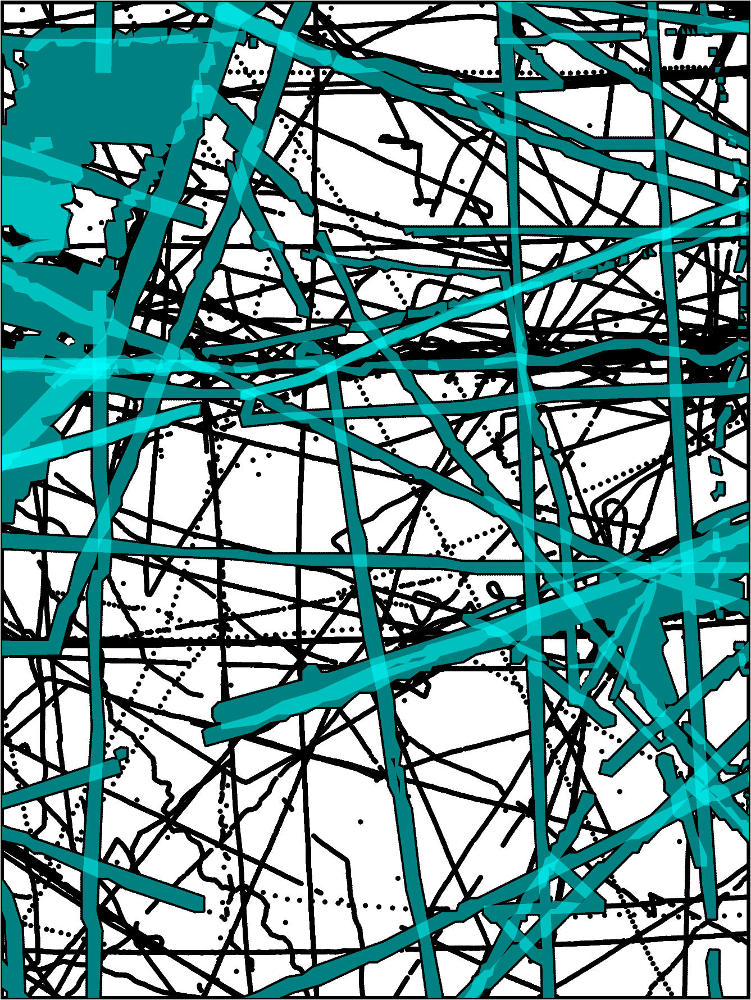

In [12]:
fig = maps.basemap(region=plot_region, points=total_ibcso_points, points_style="p2p")
fig.plot(
    ibcso_polygons_gdf,
    fill="cyan",
    close=True,
    transparency=50,
)
fig.show()

In [13]:
# calculate gravity data median distance
grd = fetch.resample_grid(bathymetry, spacing=100, verbose="q").rename(
    {"x": "easting", "y": "northing"}
)

min_dist = utils.dist_nearest_points(
    total_ibcso_points,
    grd,
).min_dist
print(f"mean minimum distance: {int(min_dist.mean().values)} m")
print(f"median minimum distance: {int(min_dist.median().values)} m")

INFO:polartoolkit:changing grid spacing


mean minimum distance: 788 m
median minimum distance: 359 m


INFO:pyogrio._io:Created 2 records


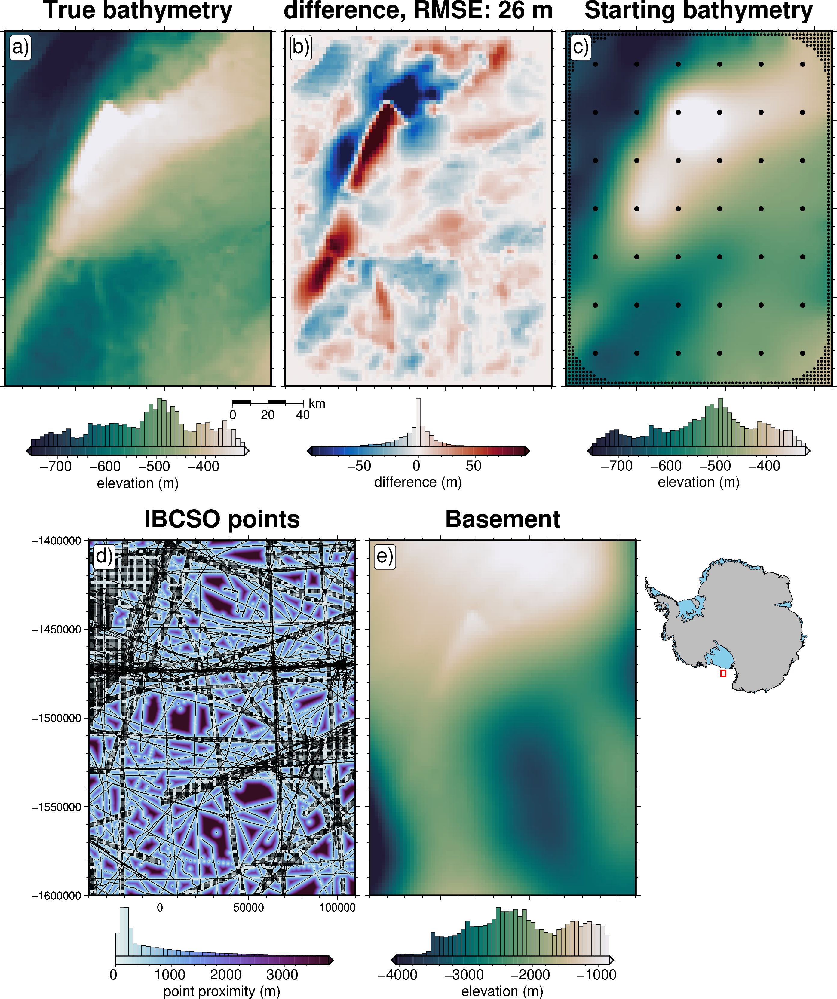

In [14]:
####
# Bathymetry
####
bathy_lims = polar_utils.get_combined_min_max(
    [bathymetry, starting_bathymetry_no_errors], robust=True
)
fig = maps.plot_grd(
    bathymetry,
    fig_height=10,
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=bathy_lims,
    title="True bathymetry",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.text(
    position="TL",
    justify="TL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Difference with starting
####
dif = bathymetry - starting_bathymetry_no_errors
fig = maps.plot_grd(
    dif,
    fig=fig,
    fig_height=10,
    origin_shift="x",
    region=plot_region,
    title=f"difference, RMSE: {round(utils.rmse(dif))} m",
    cbar_label="difference (m)",
    cbar_font="18p,Helvetica,black",
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif, robust=True, absolute=True, robust_percentiles=(0.01, 0.99)
    ),
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Starting bathymetry
####
fig = maps.plot_grd(
    starting_bathymetry_no_errors,
    fig=fig,
    fig_height=10,
    origin_shift="x",
    region=plot_region,
    title="Starting bathymetry",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=bathy_lims,
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points_dfs[0][~constraint_points_dfs[0].inside],
    points_style="p2p",
)
fig.plot(
    x=constraint_points_dfs[0][constraint_points_dfs[0].inside].easting,
    y=constraint_points_dfs[0][constraint_points_dfs[0].inside].northing,
    style="p4p",
    # fill="white",
    pen="1p,black",
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Min distance
####
fig = maps.plot_grd(
    min_dist,
    fig=fig,
    fig_height=10,
    origin_shift="both",
    xshift_amount=-1.7,
    region=plot_region,
    title="IBCSO points",
    cbar_label="point proximity (m)",
    cbar_font="18p,Helvetica,black",
    cmap="dense",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cpt_lims=[
        0,
        polar_utils.get_min_max(
            min_dist,
            robust=True,
        )[1],
    ],
    points=total_ibcso_points,
    points_style="p",
    points_fill="black",
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="d)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Basement
####
fig = maps.plot_grd(
    basement,
    fig=fig,
    origin_shift="x",
    fig_height=10,
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=polar_utils.get_min_max(
        basement, robust=True, robust_percentiles=(0.01, 0.99)
    ),
    title="Basement",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    inset=True,
    inset_position="jTR+jTL",
    inset_width=0.65,
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text="e)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)

fig.savefig("../paper/figures/Ross_Sea_location_figure.png", dpi=500)
fig.show()

# Plotting functions

In [10]:
profile_start = [plot_region[0], plot_region[3]]
profile_end = [plot_region[1], plot_region[2]]

In [11]:
def sensitivity_plot(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    num_in_top_row=2,
    plot_profile=False,
    robust_percentiles=(0.02, 0.98),
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    # first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
    cpt_lims = polar_utils.get_combined_min_max(
        grids[1],
        robust=True,
        robust_percentiles=robust_percentiles,
    )

    fig_height = 9
    for i, g in enumerate(grids):
        xshift_amount = 1

        if i == 0:
            fig = None
            origin_shift = "initialize"
            scalebar = True
        elif i == num_in_top_row:
            origin_shift = "both_shift"
            xshift_amount = -((len(grids) - 2) / 2)
            scalebar = False
        else:
            origin_shift = "xshift"
            scalebar = False

        # if i < 2:
        #     cpt_lims = first_2_lims
        # else:
        #     cpt_lims = polar_utils.get_min_max(g, robust=True)

        fig = maps.plot_grd(
            grid=g,
            fig_height=fig_height,
            title=titles[i],
            title_font="16p,Helvetica-bold,black",
            # cmap="thermal",
            cmap="ice",
            reverse_cpt=True,
            cpt_lims=(0, cpt_lims[1]),
            # cbar_label=f"uncertainty (m), mean: {round(np.nanmean(np.abs(g).values),1)}",
            cbar_unit="m",
            cbar_font="18p,Helvetica,black",
            hist=True,
            hist_bin_num=50,
            # cbar_yoffset=1,
            fig=fig,
            origin_shift=origin_shift,
            xshift_amount=xshift_amount,
            yshift_amount=-1.02,
            scalebar=scalebar,
            scalebar_position="jBR+o-.8c/-1.1c",
            points=constraint_points[~constraint_points.inside],
            points_style="p1p",
        )
        fig.plot(
            x=constraint_points[constraint_points.inside].easting,
            y=constraint_points[constraint_points.inside].northing,
            style="c.15c",
            fill="white",
            pen="1p,black",
        )
        # add mean / rms to plot
        fig.text(
            position="BR",
            justify="TR",
            text=f"RMS: {round(utils.rmse(g), 1)}",
            fill="white",
            font="16p,Helvetica,black",
            offset="j0c/.2",
            clearance="+tO",
            no_clip=True,
        )

        if i == 0 and plot_profile:
            # plot profiles location, and endpoints on map
            fig.plot(
                vd.line_coordinates(profile_start, profile_end, size=100),
                pen="2p,black",
            )
            fig.text(
                x=profile_start[0],
                y=profile_start[1],
                text="A",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            fig.text(
                x=profile_end[0],
                y=profile_end[1],
                text="A' ",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
        fig.text(
            position="TL",
            justify="TL",
            text=f"{string.ascii_lowercase[i]}",
            font="16p,Helvetica,black",
            offset="j.2c",
            no_clip=True,
            fill="white",
            clearance="+tO",
            pen=True,
        )
    if fname is not None:
        fig.savefig(fname)

    return fig

In [12]:
def sensitivity_profile(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    data_legend_loc="jTR+jTL+o1.5c/0c",
    **kwargs,
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    data_dict = profiles.make_data_dict(
        names=titles,
        grids=grids,
        colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
            "216/48/52",  # red, d83034
            "0/58/125",  # dark blue, 003a7d
            "78/203/141",  # green, 4ecb8d
            "199/1/255",  # purple, c701ff
            "255/157/58",  # orange, ff9d3a
            "0/141/255",  # med blue, 008dff
            "255/115/182",  # pink, ff73b6
            "249/232/88",  # yellow, f9e858
        ],
    )

    fig, df_data = profiles.plot_data(
        "points",
        start=profile_start,
        stop=profile_end,
        num=10000,
        fig_height=4,
        fig_width=14,
        data_dict=data_dict,
        data_legend_loc=data_legend_loc,
        # data_legend_box="+gwhite",
        data_buffer=0.01,
        data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
        # data_pen_style=[None,None,"4_2:2p"],
        data_pen_thickness=[2, 1.9, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2],
        share_yaxis=True,
        start_label="A",
        end_label="A' ",
        **kwargs,
    )

    if constraint_points is not None:
        # get grid of min dists to nearest constraints
        min_dist = utils.normalized_mindist(
            constraint_points,
            grids[0],
        )

        # set y height in data units for add dist to constraint points
        data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

        if kwargs.get("data_ylims") is not None:
            data_max = kwargs["data_ylims"][1]

        df_data = profiles.sample_grids(
            df_data, min_dist, interpolation="b", sampled_name="min_dist"
        )
        # set color limits
        series = [1e3, 10e3]

        pygmt.makecpt(
            cmap="gray",
            series=series,
            background=True,
        )
        fig.shift_origin(
            yshift=".2c",
        )
        fig.plot(
            x=df_data.dist,
            y=np.ones_like(df_data.dist) * data_max,
            style="c0.1c",
            fill=df_data.min_dist,
            cmap=True,
            no_clip=True,
        )
        fig.shift_origin(
            yshift="-.2c",
        )
        with pygmt.config(
            FONT="26p,Helvetica,black",
        ):
            fig.colorbar(
                cmap=True,
                position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
                frame=["xa+lnearest constraint", "y+lkm"],
                scale=0.001,
            )

    if fname is not None:
        fig.savefig(fname)
    fig.show()

# 1: with density CV

In [21]:
i = 1
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

# uncertainty_ds = uncertainty_results[i - 1]
sensitivity_ds = sensitivity_results[i - 1]

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


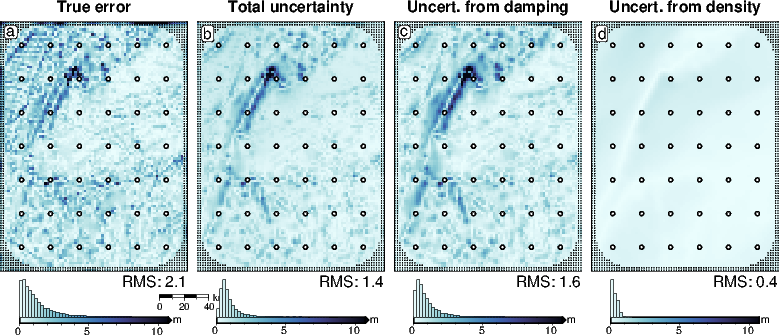

In [22]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)

# sensitivity_profile(
#     titles,
#     grids,
#     constraint_points=constraint_points,
#     data_ylims=[0, 7],
#     # data_legend_loc="jTC",
#     fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity_profiles.png",
# )

# 2: with noise

In [23]:
i = 2
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

# uncertainty_ds = uncertainty_results[i - 1]
sensitivity_ds = sensitivity_results[i - 1]

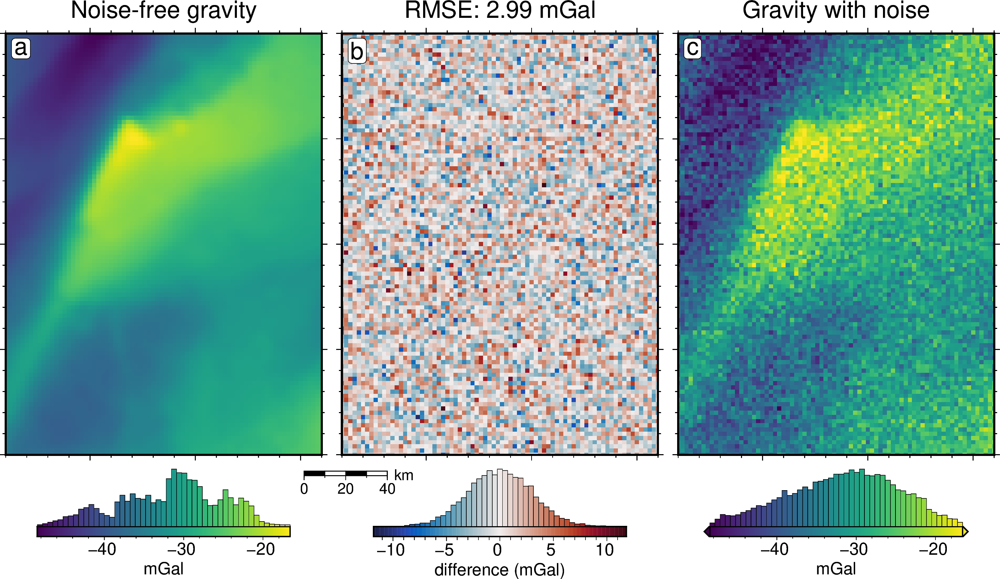

In [24]:
grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.noise_free_disturbance)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.noise_free_disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Noise-free gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    # cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

dif = grav_grid.noise_free_disturbance - grav_grid.disturbance
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
    ),
    title=f"RMSE: {round(utils.rmse(dif), 2)} mGal",
    # title=f"MAE: {round(np.nanmean(np.abs(dif)),2)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    # cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scalebar_position="jBL+o-.9c/-.6c",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity with noise",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    # cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

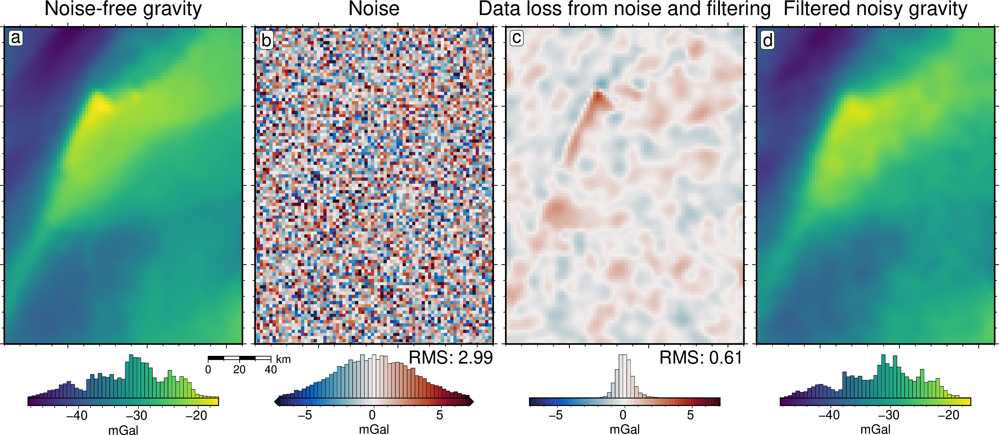

In [25]:
grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.noise_free_disturbance)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.noise_free_disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Noise-free gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the difference between noise-free and noisy gravity
dif = grav_grid.noise_free_disturbance - grav_grid.disturbance
cpt_lims = polar_utils.get_min_max(
    dif,
    absolute=True,
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=cpt_lims,
    title="Noise",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    # origin_shift="both",
    # xshift_amount=-2,
    # yshift_amount=-.98,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the difference between noisy and filtered gravity
dif = grav_grid.noise_free_disturbance - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=cpt_lims,
    title="Data loss from noise and filtering",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the filtered gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Filtered noisy gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)


# fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

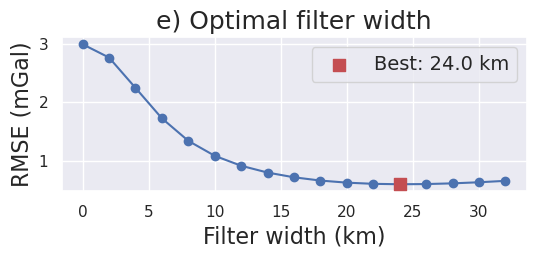

In [26]:
filter_widths_df = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_filter_width_rmse.csv"
)

_fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(
    filter_widths_df.filt_width / 1e3,
    filter_widths_df.rmse,
    marker="o",
)

best_ind = filter_widths_df.rmse.idxmin()
ax.scatter(
    x=filter_widths_df.iloc[best_ind].filt_width / 1e3,
    y=filter_widths_df.iloc[best_ind].rmse,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(filter_widths_df.iloc[best_ind].filt_width / 1e3, 2)} km",
)
ax.legend(fontsize=14)
ax.set_xlabel("Filter width (km)", fontsize=16)
ax.set_ylabel("RMSE (mGal)", fontsize=16)
ax.set_title("e) Optimal filter width", fontsize=18)

_fig.savefig(f"../tmp_outputs/Ross_Sea_0{i}_filters.png", dpi=300, bbox_inches="tight")

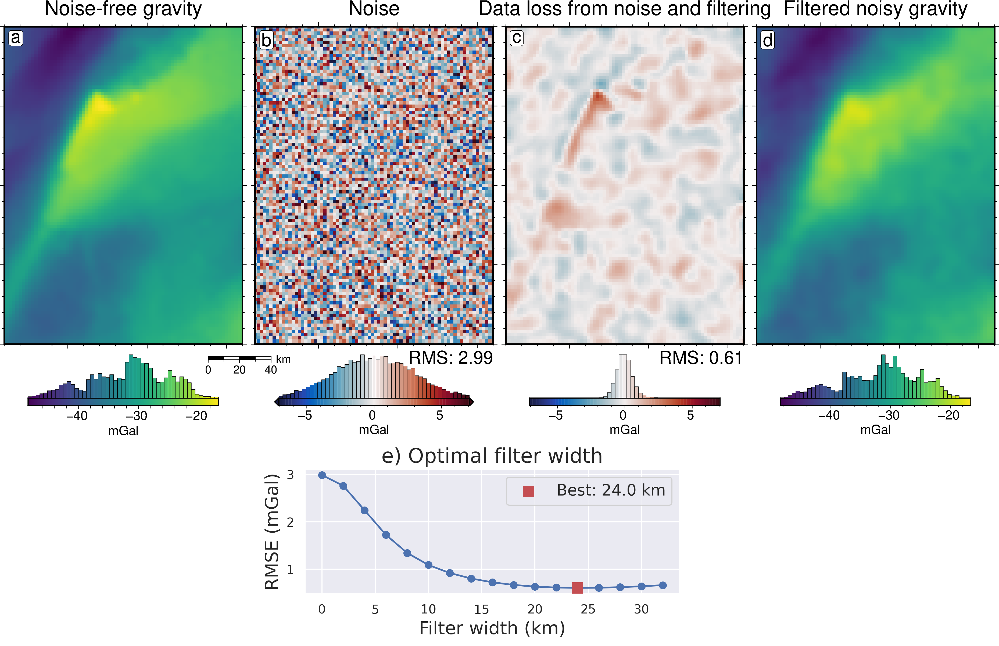

In [27]:
fig.image(
    imagefile=f"../tmp_outputs/Ross_Sea_0{i}_filters.png",
    position="n-2.1/-.3+jTL",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

In [28]:
grav_df = inversion_results[1]

noise = np.abs(grav_df.noise_free_disturbance - grav_df.disturbance)
noise.describe()

count    7676.000000
mean        2.387429
std         1.801864
min         0.000615
25%         0.955809
50%         2.028027
75%         3.421094
max        11.818300
dtype: float64

In [29]:
utils.rmse(noise)

np.float64(2.99100483668976)

In [30]:
grav_error = np.abs(grav_df.noise_free_disturbance - grav_df.gravity_anomaly)
grav_error.describe()

count    7676.000000
mean        0.463315
std         0.389367
min         0.000173
25%         0.181996
50%         0.369205
75%         0.642503
max         4.125650
dtype: float64

In [31]:
utils.rmse(grav_error)

np.float64(0.6051841170379817)

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


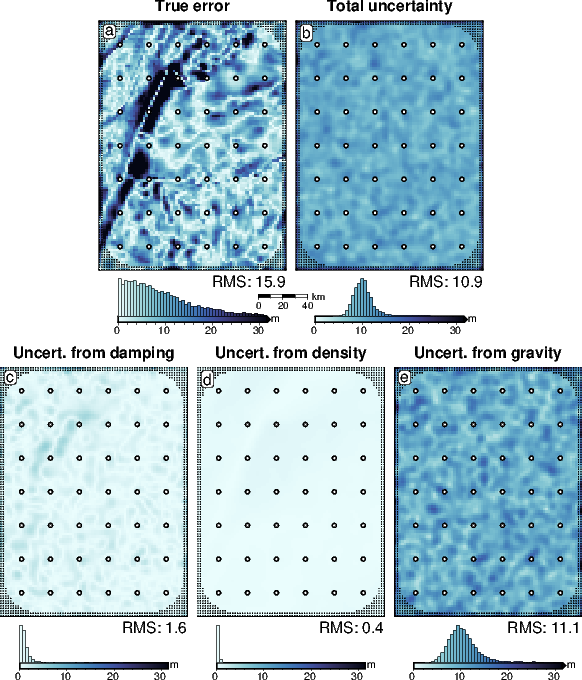

In [32]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from gravity",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.gravity_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=2,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)
# sensitivity_profile(
#     titles,
#     grids,
#     constraint_points=constraint_points,
#     data_ylims=[0, 30],
#     # data_legend_loc="jTC",
#     fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity_profiles.png",
# )

# 3: with airborne survey

In [33]:
i = 3
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

with pathlib.Path(f"../results/Ross_Sea/Ross_Sea_0{i}_eq_sources.pickle").open(
    "rb"
) as f:
    eqs_study = pickle.load(f)

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

# grav_df = inversion_results[1]

grav_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df.csv")

grav_survey_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_survey_df.csv")

# uncertainty_ds = uncertainty_results[i - 1]
sensitivity_ds = sensitivity_results[i - 1]

In [34]:
grav_df.describe()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,gravity_anomaly_deterministic,starting_gravity,misfit,reg,res,predicted_grav,eqs_uncert,gravity_anomaly_eqs_mean,gravity_anomaly,uncert
count,7.676000e+03,7676.000000,7676.0,7676.000000,7676.0,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000
mean,-1.500000e+06,35000.000000,1000.0,-31.727297,0.0,-31.727297,-31.727297,-31.706574,-31.706574,-31.307368,-0.393689,-0.197531,-0.196158,-31.699674,0.053538,-31.701057,-31.701057,0.053538
std,5.831332e+04,43877.680138,0.0,6.458138,0.0,6.458138,6.458138,6.432323,6.432323,6.220029,1.237688,0.000000,1.237688,6.423440,0.076368,6.425498,6.425498,0.076368
min,-1.600000e+06,-40000.000000,1000.0,-48.457766,0.0,-48.457766,-48.457766,-48.094850,-48.094850,-48.209646,-7.268995,-0.197531,-7.071464,-48.134524,0.001517,-48.085594,-48.085594,0.001517
25%,-1.550000e+06,-2500.000000,1000.0,-36.286368,0.0,-36.286368,-36.286368,-36.308652,-36.308652,-35.436134,-0.755589,-0.197531,-0.558058,-36.285327,0.018445,-36.297955,-36.297955,0.018445
50%,-1.500000e+06,35000.000000,1000.0,-31.030073,0.0,-31.030073,-31.030073,-30.978661,-30.978661,-30.827296,-0.295380,-0.197531,-0.097849,-30.980293,0.031697,-30.977283,-30.977283,0.031697
75%,-1.450000e+06,72500.000000,1000.0,-27.279068,0.0,-27.279068,-27.279068,-27.240574,-27.240574,-26.861442,0.038447,-0.197531,0.235978,-27.233140,0.056035,-27.237602,-27.237602,0.056035
max,-1.400000e+06,110000.000000,1000.0,-16.585801,0.0,-16.585801,-16.585801,-16.551552,-16.551552,-16.852776,5.599738,-0.197531,5.797269,-16.787902,0.833729,-16.734489,-16.734489,0.833729


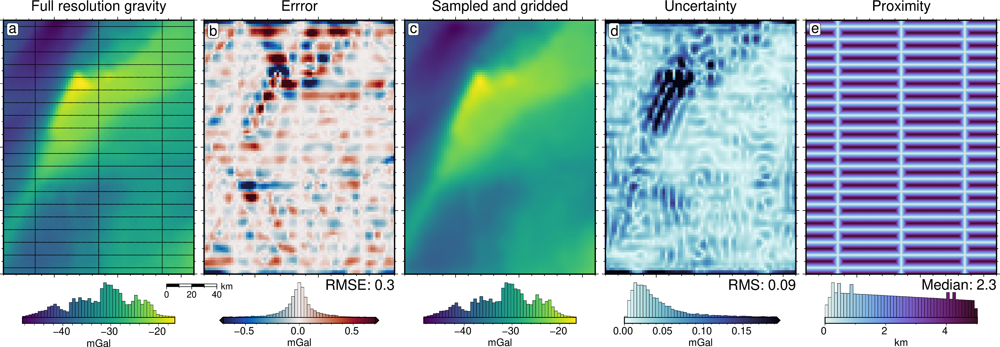

In [35]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    cpt_lims=lims,
    title="Full resolution gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
dif = grav_grid.gravity_anomaly_full_res - grav_grid.gravity_anomaly
dif_lims = polar_utils.get_min_max(
    dif,
    absolute=True,
    robust=True,
    # robust_percentiles=(0.05, 0.95),
)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=dif_lims,
    title="Errror",  # , RMSE: {round(utils.rmse(dif),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Sampled and gridded",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the eq source uncertainty
fig = maps.plot_grd(
    grav_grid.uncert,
    fig_height=10,
    cpt_lims=(
        0,
        polar_utils.get_min_max(
            grav_grid.uncert,
            robust=True,
            robust_percentiles=(0.04, 0.96),
        )[1],
    ),
    cmap="ice",
    reverse_cpt=True,
    title="Uncertainty",  # , RMS: {round(utils.rmse(grav_grid.uncert),2)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # , RMS: {round(utils.rmse(grav_grid.uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(grav_grid.uncert), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

coords = vd.grid_coordinates(
    region=inversion_region,
    spacing=100,
)
grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z
min_dist = (
    utils.dist_nearest_points(
        grav_survey_df,
        grid,
    ).min_dist
    / 1e3
)

fig = maps.plot_grd(
    min_dist,
    fig_height=10,
    cpt_lims=(
        0,
        polar_utils.get_min_max(
            min_dist,
        )[1],
    ),
    cmap="dense",
    title="Proximity",  # , median: {round(np.median(min_dist),2)} km",
    title_font="16p,Helvetica,black",
    cbar_label="km",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"Median: {round(np.median(min_dist), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

In [36]:
df = eqs_study.trials_dataframe().sort_values("value").reset_index(drop=True)
df = df.iloc[2:].reset_index(drop=True)
df = df.drop(3).reset_index(drop=True)
df

,number,value,datetime_start,datetime_complete,duration,params_damping,params_depth,system_attrs_fixed_params,state
0,7,0.975067,2025-03-04 12:54:02.527647,2025-03-04 12:54:04.211674,0 days 00:00:01.684027,0.098499,72439.765810,NaN,COMPLETE
1,3,0.976299,2025-03-04 12:53:55.853492,2025-03-04 12:53:57.455045,0 days 00:00:01.601553,0.762644,59952.265810,NaN,COMPLETE
2,5,0.976426,2025-03-04 12:53:59.158742,2025-03-04 12:54:00.757727,0 days 00:00:01.598985,0.004572,84927.265810,NaN,COMPLETE
3,4,0.994434,2025-03-04 12:53:57.456615,2025-03-04 12:53:59.157869,0 days 00:00:01.701254,0.035399,34977.265810,NaN,COMPLETE
4,6,0.995391,2025-03-04 12:54:00.758740,2025-03-04 12:54:02.526577,0 days 00:00:01.767837,2.122102,22489.765810,NaN,COMPLETE
5,9,0.999350,2025-03-04 12:54:06.257146,2025-03-04 12:54:08.086556,0 days 00:00:01.829410,0.411685,14173.067445,NaN,COMPLETE
6,8,0.999677,2025-03-04 12:54:04.234022,2025-03-04 12:54:06.255388,0 days 00:00:02.021366,0.001000,19115.478971,NaN,COMPLETE
7,11,0.999952,2025-03-04 12:54:09.998957,2025-03-04 12:54:11.875139,0 days 00:00:01.876182,0.001000,13499.630302,NaN,COMPLETE
8,2,0.999986,2025-03-04 12:53:54.014037,2025-03-04 12:53:55.851203,0 days 00:00:01.837166,0.001643,10002.265810,NaN,COMPLETE


In [37]:
spline = vd.Spline(damping=None)
coords = (
    df.params_depth,
    df.params_damping,
)
spline.fit(
    coords,
    df.value,
)
grid_coords = vd.grid_coordinates(
    region=vd.get_region(coords),
    shape=(100, 100),
    pixel_register=True,
)
grid = vd.make_xarray_grid(
    grid_coords,
    data=np.ones_like(grid_coords[0]),
    data_names="data",
    dims=("damping", "depth"),  # these need to be swapped
).data
score_df = vd.grid_to_table(grid).drop(columns="data")

score_df["score"] = spline.predict((score_df.damping, score_df.depth))
# grid = spline.grid(
#     region=vd.get_region(coords),
#     shape=(100,100),
#     dims=["damping", "depth"], # these need to be swapped
#     data_names="score",
# ).score
# grid
grid = score_df.set_index(["damping", "depth"]).to_xarray().score

In [38]:
df

,number,value,datetime_start,datetime_complete,duration,params_damping,params_depth,system_attrs_fixed_params,state
0,7,0.975067,2025-03-04 12:54:02.527647,2025-03-04 12:54:04.211674,0 days 00:00:01.684027,0.098499,72439.765810,NaN,COMPLETE
1,3,0.976299,2025-03-04 12:53:55.853492,2025-03-04 12:53:57.455045,0 days 00:00:01.601553,0.762644,59952.265810,NaN,COMPLETE
2,5,0.976426,2025-03-04 12:53:59.158742,2025-03-04 12:54:00.757727,0 days 00:00:01.598985,0.004572,84927.265810,NaN,COMPLETE
3,4,0.994434,2025-03-04 12:53:57.456615,2025-03-04 12:53:59.157869,0 days 00:00:01.701254,0.035399,34977.265810,NaN,COMPLETE
4,6,0.995391,2025-03-04 12:54:00.758740,2025-03-04 12:54:02.526577,0 days 00:00:01.767837,2.122102,22489.765810,NaN,COMPLETE
5,9,0.999350,2025-03-04 12:54:06.257146,2025-03-04 12:54:08.086556,0 days 00:00:01.829410,0.411685,14173.067445,NaN,COMPLETE
6,8,0.999677,2025-03-04 12:54:04.234022,2025-03-04 12:54:06.255388,0 days 00:00:02.021366,0.001000,19115.478971,NaN,COMPLETE
7,11,0.999952,2025-03-04 12:54:09.998957,2025-03-04 12:54:11.875139,0 days 00:00:01.876182,0.001000,13499.630302,NaN,COMPLETE
8,2,0.999986,2025-03-04 12:53:54.014037,2025-03-04 12:53:55.851203,0 days 00:00:01.837166,0.001643,10002.265810,NaN,COMPLETE


(-0.04142203060414228, 2.164523560811256)

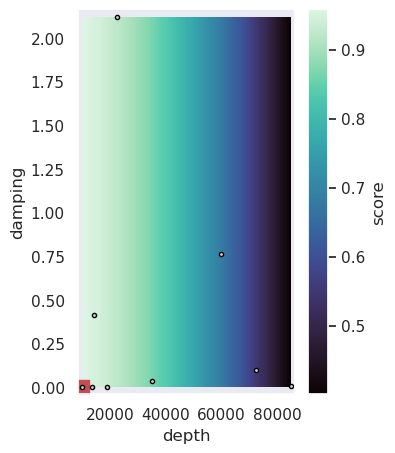

In [39]:
_fig, ax = plt.subplots(figsize=(3.5, 5))

grid.plot(
    # yscale="log",
    cmap=sns.color_palette("mako", as_cmap=True),
    ax=ax,
)
best_ind = df.value.idxmax()
ax.scatter(
    y=df.iloc[best_ind].params_damping,
    x=df.iloc[best_ind].params_depth,
    marker="s",
    s=100,
    color="r",
    label="Best",
)
ax.scatter(
    y=df.params_damping,
    x=df.params_depth,
    marker=".",
    color="lightgray",
    edgecolor="black",
)
depth_range = df.params_depth.max() - df.params_depth.min()
ax.set_xlim(
    df.params_depth.min() - (depth_range * 0.02),
    df.params_depth.max() + (depth_range * 0.02),
)
damping_range = df.params_damping.max() - df.params_damping.min()
ax.set_ylim(
    df.params_damping.min() - (damping_range * 0.02),
    df.params_damping.max() + (damping_range * 0.02),
)

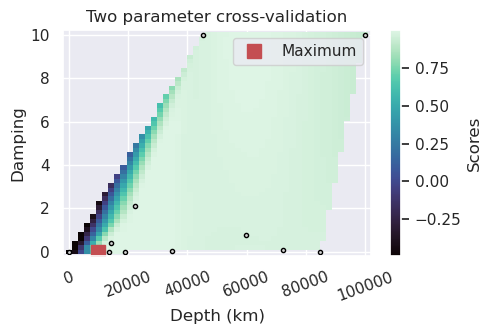

In [40]:
plotting.plot_2_parameter_cv_scores_uneven(
    eqs_study,
    param_names=(
        "params_depth",
        "params_damping",
    ),
    plot_param_names=(
        "Depth (km)",
        "Damping",
    ),
    best="max",
    # logy=True,
    robust=True,
)

In [41]:
# df1 = eqs_study.trials_dataframe().sort_values("value").iloc[2:]

# _fig, ax = plt.subplots(figsize=(3.5, 5))

# # plot depths
# df = df1.sort_values("params_depth").iloc[:].reset_index(drop=True)
# ax.plot(
#     df.params_depth/1e3,
#     df.value,
#     marker='o',
# )
# best_ind = df.value.idxmax()
# ax.scatter(
#     x=df.iloc[best_ind].params_depth/1e3,
#     y=df.iloc[best_ind].value,
#     marker="s",
#     color="r",
#     s=80,
#     zorder=20,
#     label=f"Best depth: {round(df.iloc[best_ind].params_depth/1e3)} km",
# )

# # plot dampings
# ax2 = ax.twiny()
# df = df1.sort_values("params_damping").iloc[:].reset_index(drop=True)
# ax.plot(
#     df.params_damping,
#     df.value,
#     marker='o',
# )
# best_ind = df.value.idxmax()
# ax.scatter(
#     x=df.iloc[best_ind].params_damping,
#     y=df.iloc[best_ind].value,
#     marker="s",
#     color="r",
#     s=80,
#     zorder=20,
#     label=f"Best damping: {round(df.iloc[best_ind].params_damping)}",
# )


# ax.legend(fontsize=12)
# ax.set_xlabel("Depth (km)", fontsize=16)
# ax2.set_xlabel("Damping", fontsize=16)
# ax.set_ylabel("$R^2$ score", fontsize=16)
# ax.set_title("Equivalent source parameters", fontsize=17)

# ax.annotate(
#     "f",
#     xy=(0.05, .97), xycoords='axes fraction',
#     fontsize=17,
#     va='top',
#     ha="left",
#     bbox=dict(boxstyle="round,pad=0.1",facecolor='white', edgecolor='k', pad=3.0),
# )

# # ax.set_yticks([0.99, 1])
# ax.yaxis.tick_right()
# # ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.2f'))

# _fig.tight_layout()
# # _fig.savefig(f"../tmp_outputs/Ross_Sea_0{i}_eq_sources.png", dpi=300, bbox_inches="tight")


In [42]:
# fig.image(
#     imagefile=f"../tmp_outputs/Ross_Sea_0{i}_eq_sources.png",
#     position="n-2.1/-.3+jTL",
# )
# # fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
# fig.show()

In [43]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res - grav_df.gravity_anomaly)
print(utils.rmse(grav_error))
grav_error.describe()

0.2955552214879052


count    7676.000000
mean        0.140733
std         0.259915
min         0.000016
25%         0.027359
50%         0.066100
75%         0.151544
max         4.329134
dtype: float64

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


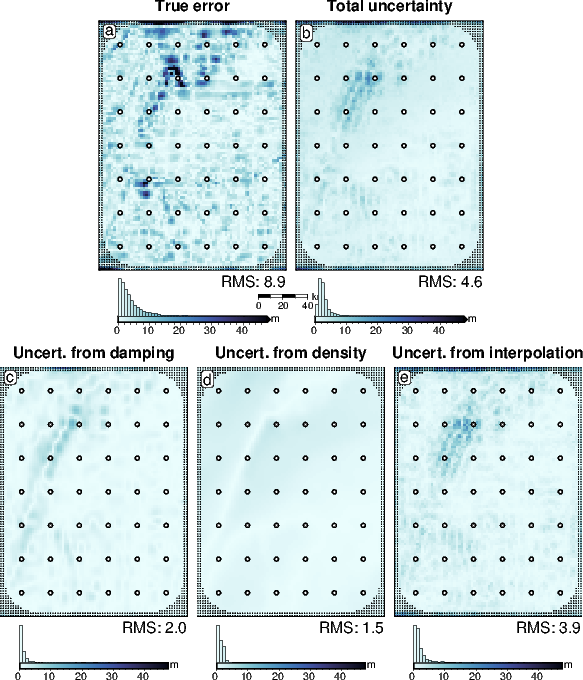

In [44]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from interpolation",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds["equivalent source gridding_stdev"],
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=2,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)
# sensitivity_profile(
#     titles,
#     grids,
#     constraint_points=constraint_points,
#     data_ylims=[0, 20],
#     # data_legend_loc="jTC",
#     fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity_profiles.png",
# )

# 4: with regional

In [45]:
i = 4
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

with pathlib.Path(
    f"../tmp_outputs/Ross_Sea_0{i}_regional_sep_true_density.pickle"
).open("rb") as f:
    regional_study = pickle.load(f)

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

grav_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df_true_density.csv")
# reg_uncert = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df.csv")["reg_uncert"]
# grav_df["reg_uncert"] = reg_uncert

# uncertainty_ds = uncertainty_results[i - 1]
sensitivity_ds = sensitivity_results[i - 1]

In [46]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-36.298936,-71.849978,-35.578552,-3.009683,-36.271426,-36.368591,0.097165,0.221097
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-33.944812,-69.999465,-36.042636,-3.088827,-33.956829,-33.947937,-0.008892,0.127489
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-31.389260,-67.862409,-36.460093,-3.125503,-31.402316,-31.353333,-0.048984,0.157625
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-28.675560,-65.431172,-36.784646,-3.111119,-28.646526,-28.625488,-0.021038,0.172964
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-25.847705,-62.798738,-36.998466,-3.110972,-25.800271,-25.799377,-0.000894,0.157999


In [47]:
# calculate the true residual and regional misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity
# grav_df["true_reg"] = grav_df.gravity_anomaly - grav_df.bathymetry_grav
grav_df["true_reg"] = grav_df.basement_grav
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,true_reg
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-36.298936,-71.849978,-35.578552,0.027510,-36.271426,-36.368591,0.097165,0.221097,-36.298936
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-33.944812,-69.999465,-36.042636,-0.012017,-33.956829,-33.947937,-0.008892,0.127489,-33.944812
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-31.389260,-67.862409,-36.460093,-0.013056,-31.402316,-31.353333,-0.048984,0.157625,-31.389260
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-28.675560,-65.431172,-36.784646,0.029034,-28.646526,-28.625488,-0.021038,0.172964,-28.675560
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-25.847705,-62.798738,-36.998466,0.047434,-25.800271,-25.799377,-0.000894,0.157999,-25.847705


In [48]:
print(f"MA of regional: {np.abs(grav_df.reg).mean()}")
print(f"RMS of regional: {utils.rmse(grav_df.reg)}")
print(f"MAE of regional: {np.abs(grav_df.true_reg - grav_df.reg).mean()}")
print(f"RMSE of regional: {utils.rmse(grav_df.true_reg - grav_df.reg)}")
print(f"Max regional error: {np.abs(grav_df.true_reg - grav_df.reg).max()}")

MA of regional: 15.362384567539042
RMS of regional: 18.368035157992665
MAE of regional: 0.3684446728509241
RMSE of regional: 0.5086764649974351
Max regional error: 2.9020860690145724


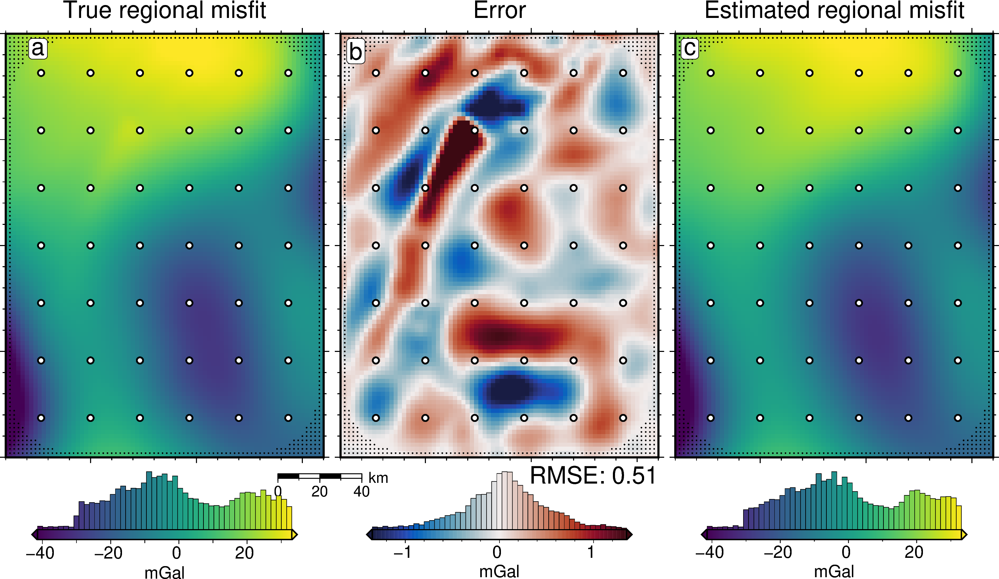

In [49]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_grid["true_reg"] = grav_grid.basement_grav

reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="viridis",
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.show()

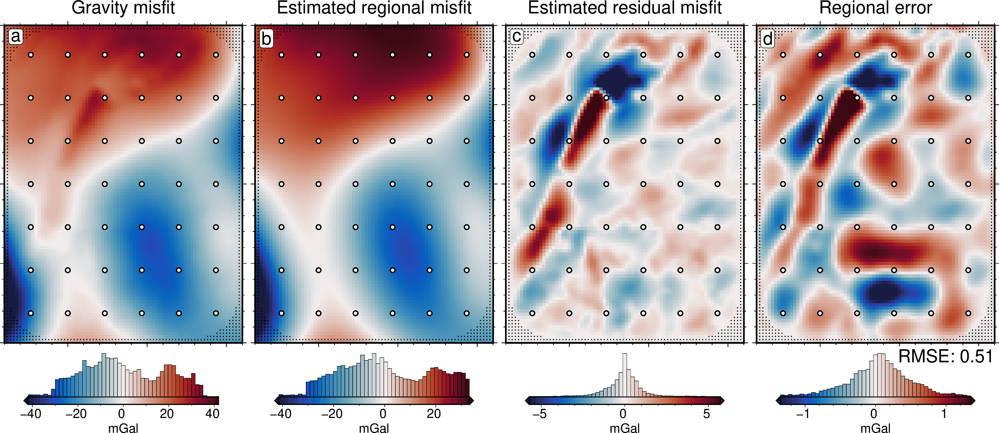

In [50]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# plot gravity misfit
dif = grav_grid.gravity_anomaly - grav_grid.starting_gravity
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Gravity misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated regional
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)

fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated residual
fig = maps.plot_grd(
    grav_grid.res,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        grav_grid.res,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Estimated residual misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)


# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Regional error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.show()

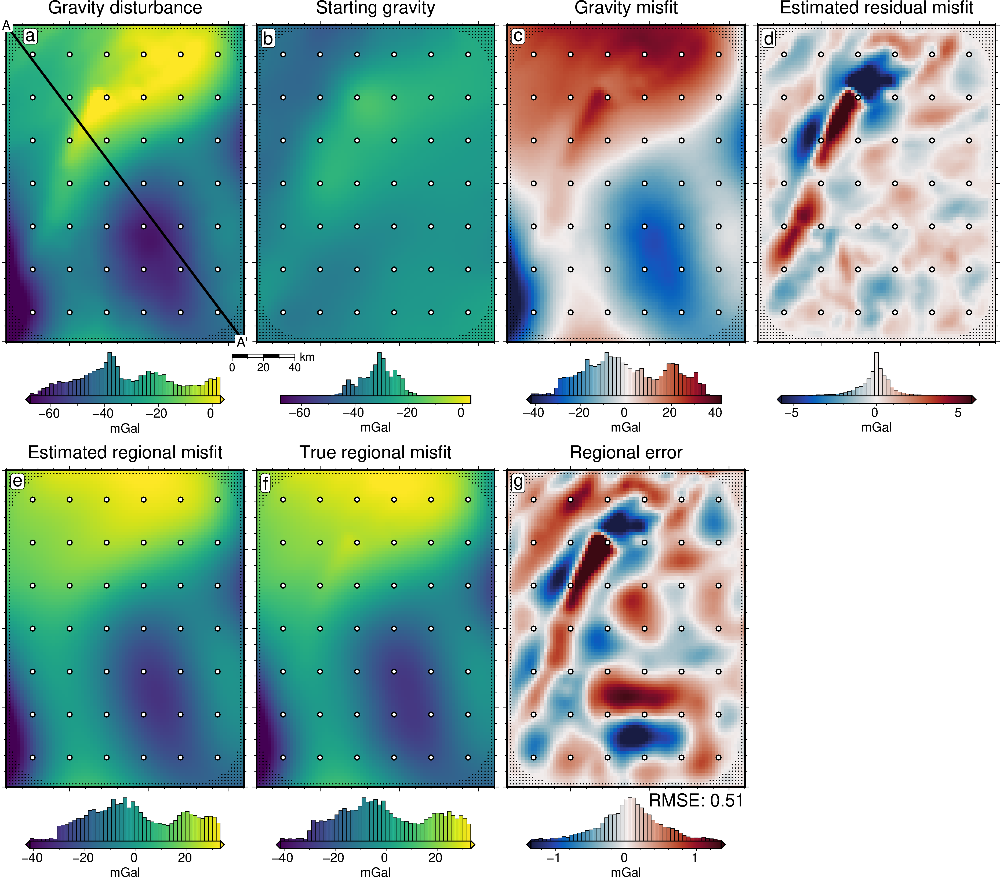

In [51]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(
    grav_grid.gravity_anomaly,
    robust=True,
)

# plot the observed gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity disturbance",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-1.6c/-.6c",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the starting gravity
fig = maps.plot_grd(
    grav_grid.starting_gravity,
    fig_height=10,
    cpt_lims=lims,
    title="Starting gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot gravity misfit
dif = grav_grid.gravity_anomaly - grav_grid.starting_gravity
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Gravity misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated residual
fig = maps.plot_grd(
    grav_grid.res,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        grav_grid.res,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Estimated residual misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated regional
reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="both",
    yshift_amount=-0.98,
    xshift_amount=-3,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)

fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="f",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Regional error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="g",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# # plot the regional uncertainty
# fig = maps.plot_grd(
#     grav_grid.reg_uncert,
#     fig_height=10,
#     cmap="ice",
#     reverse_cpt=True,
#     cpt_lims=(0,
#         polar_utils.get_min_max(
#             grav_grid.reg_uncert,
#             robust=True,
#             robust_percentiles=(0.01, 0.99),
#         )[1],
#     ),
#     title="Regional uncertainty",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",#f"mGal, RMS: {round(utils.rmse(grav_grid.reg_uncert),2)}",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="x",
#     points=constraint_points[~constraint_points.inside],
#     points_style="p1p",
# )
# # add mean / rms to plot
# fig.text(
#     position="BR",
#     justify="TR",
#     text=f"RMS: {round(utils.rmse(grav_grid.reg_uncert),2)}",
#     fill="white",
#     font="16p,Helvetica,black",
#     offset="j0c/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.plot(
#     x=constraint_points[constraint_points.inside].easting,
#     y=constraint_points[constraint_points.inside].northing,
#     style="c.15c",
#     fill="white",
#     pen="1p,black",
# )
# fig.text(
#     position="TL",
#     text="h",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
fig.show()

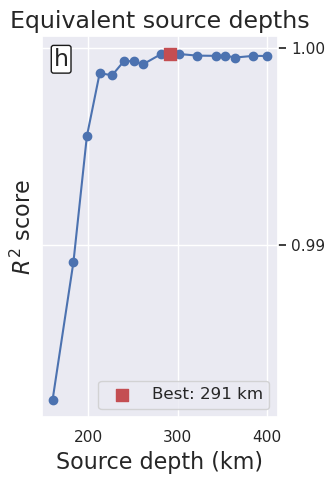

In [52]:
df = regional_study.trials_dataframe().sort_values("params_depth")
df = df.iloc[3:].reset_index(drop=True)

_fig, ax = plt.subplots(figsize=(3.5, 5))
ax.plot(
    df.params_depth / 1e3,
    df.value,
    marker="o",
)

best_ind = df.value.idxmax()
ax.scatter(
    x=df.iloc[best_ind].params_depth / 1e3,
    y=df.iloc[best_ind].value,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(df.iloc[best_ind].params_depth / 1e3)} km",
)

ax.legend(fontsize=12)
ax.set_xlabel("Source depth (km)", fontsize=16)
ax.set_ylabel("$R^2$ score", fontsize=16)
ax.set_title("Equivalent source depths", fontsize=17)

ax.annotate(
    "h",
    xy=(0.05, 0.97),
    xycoords="axes fraction",
    fontsize=17,
    va="top",
    ha="left",
    bbox=dict(boxstyle="round,pad=0.1", facecolor="white", edgecolor="k", pad=3.0),
)

ax.set_yticks([0.99, 1])
ax.yaxis.tick_right()
ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter("%.2f"))

_fig.tight_layout()
_fig.savefig(
    f"../tmp_outputs/Ross_Sea_0{i}_eq_sources.png", dpi=300, bbox_inches="tight"
)

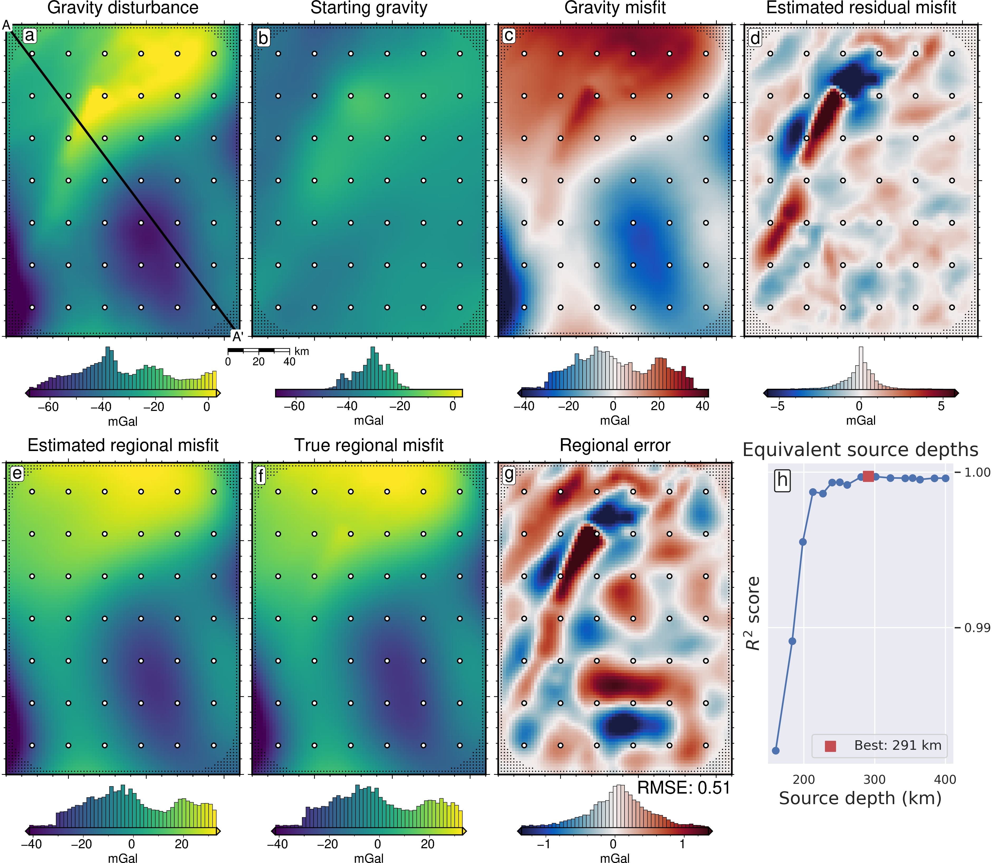

In [53]:
fig.image(
    imagefile=f"../tmp_outputs/Ross_Sea_0{i}_eq_sources.png",
    position="n1.01/.48+jML",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
fig.show()

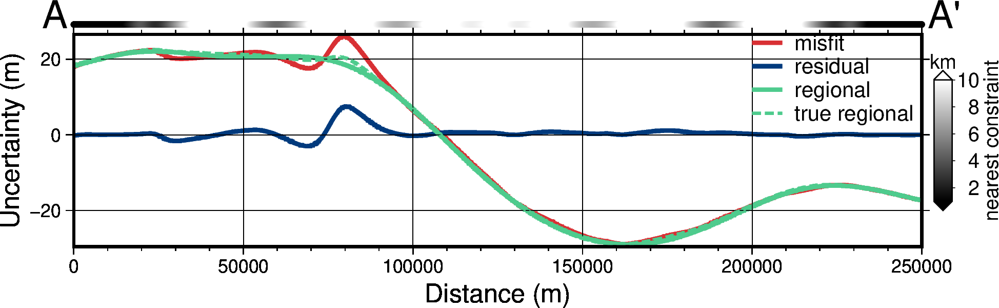

In [54]:
titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
    # "true residual",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
    # grav_grid.true_res,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "78/203/141",  # green, 4ecb8d
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    # data_legend_loc="jTR+jTL+o1.5c/0c",
    # data_legend_box="+gwhite",
    data_legend_loc="jTR+o0c/-.2c",
    # data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lUncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["easting", "northing", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [1e3, 10e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies_profiles.png")
fig.show()

In [55]:
np.abs(dif).mean(), np.abs(dif).max()

(<xarray.DataArray ()> Size: 8B
 array(0.36844467),
 <xarray.DataArray ()> Size: 8B
 array(2.90208607))

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


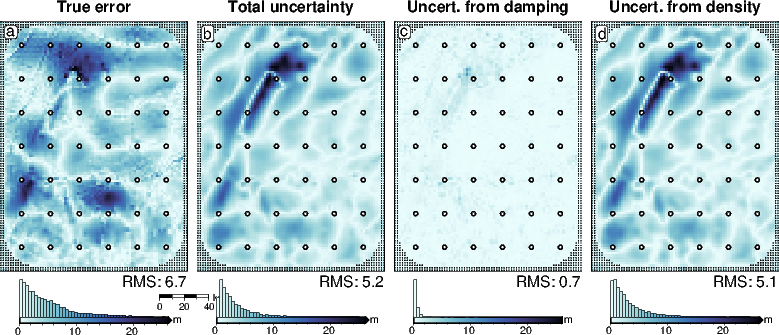

In [56]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    # "Uncert. from regional",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    # sensitivity_ds.regional_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)
# sensitivity_profile(
#     titles,
#     grids,
#     constraint_points=constraint_points,
#     data_ylims=[0, 22],
#     # data_legend_loc="jTC+o3c/0c",
#     fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity_profiles.png",
# )

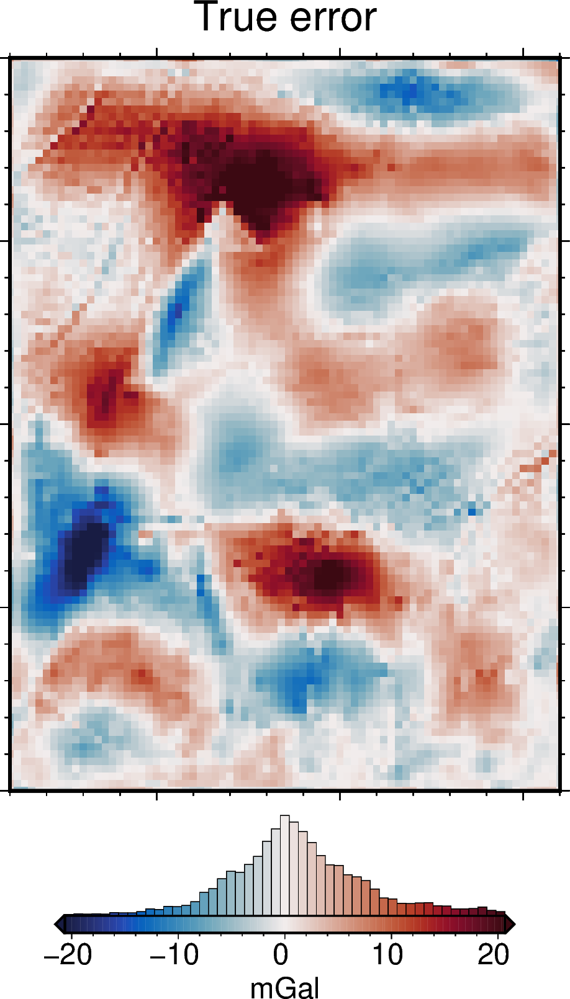

In [57]:
err = final_bathymetry - bathymetry
fig = maps.plot_grd(
    err,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        err,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="True error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
)
fig.show()

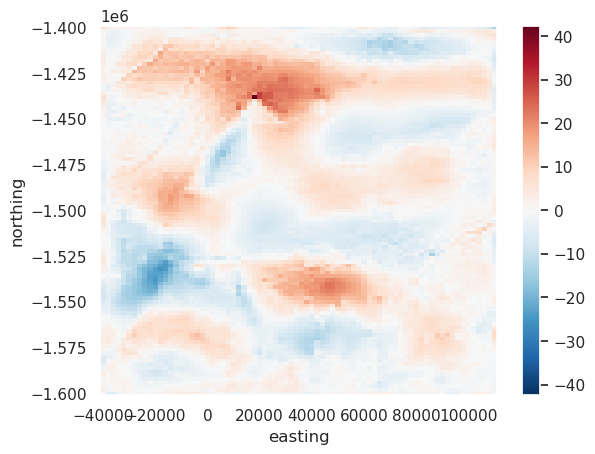

In [58]:
err.plot()

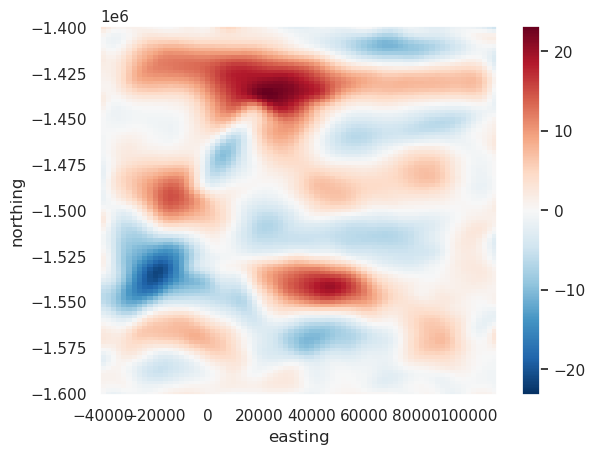

In [59]:
filt = utils.filter_grid(err, 20e3)
filt.plot()

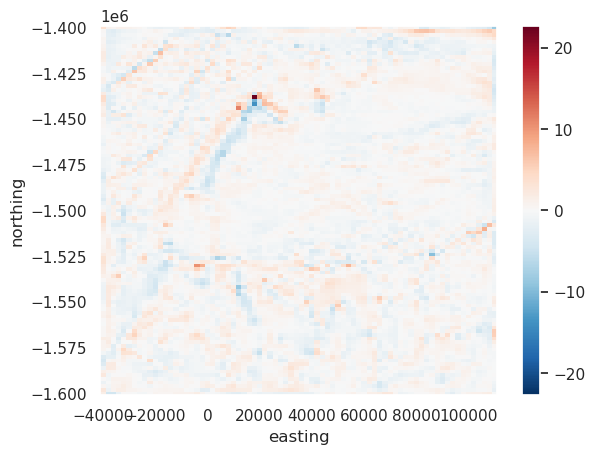

In [60]:
filt2 = utils.filter_grid(err, 20e3, filt_type="highpass")
filt2.plot()

# 5: Realistic scenario

In [61]:
i = 5
final_bathymetry = final_bathymetries[i - 1]
inversion_results = optimal_results[i - 1]

damping_study = damping_studies[i - 1]
density_study = density_studies[i - 1]

with pathlib.Path(
    f"../tmp_outputs/Ross_Sea_0{i}_regional_sep_true_density.pickle"
).open("rb") as f:
    regional_study = pickle.load(f)

constraint_points = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_constraint_points.csv"
)

uncertainty = final_uncertainties[i - 1]
stochastic_mean = final_stochastic_means[i - 1]

grav_df = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df_true_density.csv")
# reg_uncert = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df.csv")["reg_uncert"]
# grav_df["reg_uncert"] = reg_uncert

eqs_uncert = pd.read_csv(f"../results/Ross_Sea/Ross_Sea_0{i}_grav_df.csv")["eqs_uncert"]
grav_df["eqs_uncert"] = eqs_uncert


# uncertainty_ds = uncertainty_results[i - 1]
sensitivity_ds = sensitivity_results[i - 1]

(array([5.000e+00, 9.900e+01, 3.310e+02, 2.007e+03, 3.395e+03, 1.497e+03,
        2.770e+02, 5.100e+01, 1.200e+01, 2.000e+00]),
 array([-76.53114861, -58.89664177, -41.26213493, -23.62762809,
         -5.99312125,  11.64138559,  29.27589244,  46.91039928,
         64.54490612,  82.17941296,  99.8139198 ]),
 <BarContainer object of 10 artists>)

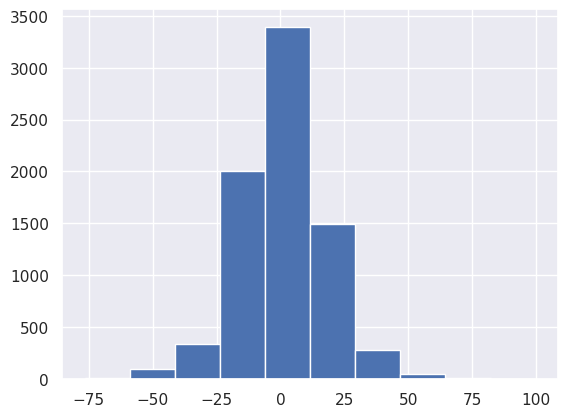

In [62]:
(final_bathymetry - bathymetry).plot.hist()

In [63]:
(starting_bathymetry - bathymetry).values.max()

np.float64(164.39924940021547)

In [64]:
(final_bathymetry - bathymetry).values.max()

np.float64(99.81391979842289)

In [65]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,eqs_uncert
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-36.298936,-71.849978,-72.203217,1,-66.194382,-66.194382,-35.578552,-3.009683,-30.615831,-31.367126,0.751296,0.432347,1.681647
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-33.944812,-69.999465,-70.828738,1,-65.859383,-65.859383,-36.042636,-3.088827,-29.816748,-29.761597,-0.055151,0.384295,1.431747
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-31.389260,-67.862409,-68.200501,1,-64.724739,-64.724739,-36.460093,-3.125503,-28.264646,-27.928833,-0.335813,0.386161,1.285882
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-28.675560,-65.431172,-64.135670,1,-62.967335,-62.967335,-36.784646,-3.111119,-26.182689,-25.889648,-0.293041,0.327731,1.127507
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-25.847705,-62.798738,-63.711749,1,-60.756437,-60.756437,-36.998466,-3.110972,-23.757971,-23.676208,-0.081763,0.237698,0.950486


In [66]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)
print(
    f"MAE of gravity: {np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly).mean()}"
)
print(
    f"RMSE of gravity: {utils.rmse(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)}"
)
grav_error.describe()

MAE of gravity: 0.41085594394291824
RMSE of gravity: 0.5817454349962353


count    7676.000000
mean        0.410856
std         0.411883
min         0.000001
25%         0.144110
50%         0.308707
75%         0.549935
max         6.062156
dtype: float64

In [67]:
# calculate the true residual and regional misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity
# grav_df["true_reg"] = grav_df.gravity_anomaly - grav_df.bathymetry_grav
grav_df["true_reg"] = grav_df.basement_grav
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,eqs_uncert,true_reg
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-36.298936,-71.849978,-72.203217,1,-66.194382,-66.194382,-35.578552,0.027510,-30.615831,-31.367126,0.751296,0.432347,1.681647,-36.298936
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-33.944812,-69.999465,-70.828738,1,-65.859383,-65.859383,-36.042636,-0.012017,-29.816748,-29.761597,-0.055151,0.384295,1.431747,-33.944812
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-31.389260,-67.862409,-68.200501,1,-64.724739,-64.724739,-36.460093,-0.013056,-28.264646,-27.928833,-0.335813,0.386161,1.285882,-31.389260
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-28.675560,-65.431172,-64.135670,1,-62.967335,-62.967335,-36.784646,0.029034,-26.182689,-25.889648,-0.293041,0.327731,1.127507,-28.675560
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-25.847705,-62.798738,-63.711749,1,-60.756437,-60.756437,-36.998466,0.047434,-23.757971,-23.676208,-0.081763,0.237698,0.950486,-25.847705


In [68]:
print(f"MA of regional: {np.abs(grav_df.reg).mean()}")
print(f"RMS of regional: {utils.rmse(grav_df.reg)}")
print(f"MAE of regional: {np.abs(grav_df.true_reg - grav_df.reg).mean()}")
print(f"RMSE of regional: {utils.rmse(grav_df.true_reg - grav_df.reg)}")
print(f"Max regional error: {np.abs(grav_df.true_reg - grav_df.reg).max()}")

MA of regional: 15.230646790409535
RMS of regional: 18.21819044311092
MAE of regional: 0.6149410210420558
RMSE of regional: 0.8151890673955929
Max regional error: 6.104089579823146


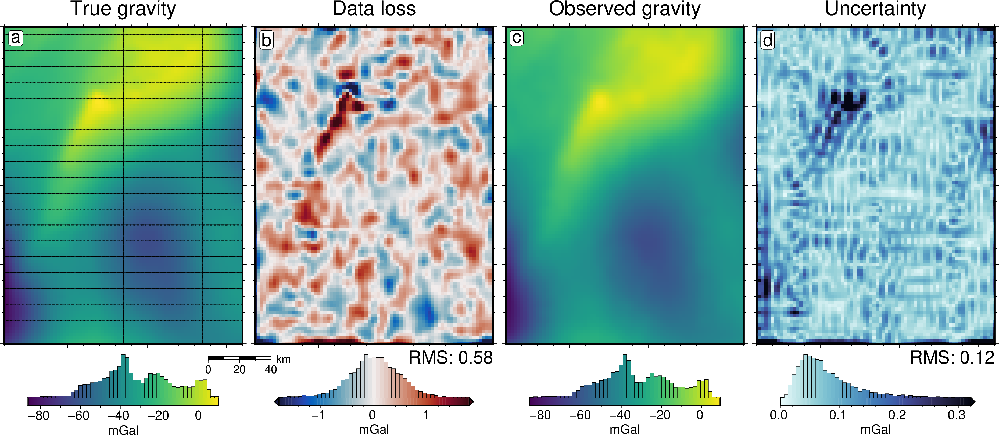

In [69]:
# grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res_no_noise,
    fig_height=10,
    cpt_lims=lims,
    title="True gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the difference between noisy and filtered gravity
dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Data loss",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    # origin_shift="both",
    # xshift_amount=-1,
    # yshift_amount=-.98,
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the sampled, interpolated, and filtered gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Observed gravity",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)


# plot the sampled, interpolated, and filtered gravity
fig = maps.plot_grd(
    grav_grid.eqs_uncert,
    fig_height=10,
    cpt_lims=(
        0,
        polar_utils.get_min_max(
            grav_grid.eqs_uncert,
            robust=True,
        )[1],
    ),
    cmap="ice",
    reverse_cpt=True,
    title="Uncertainty",  #: RMS: {round(utils.rmse(grav_grid.eqs_uncert),2)}",
    title_font="18p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMS: {round(utils.rmse(grav_grid.eqs_uncert), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

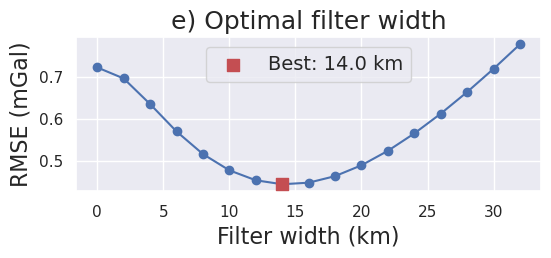

In [70]:
filter_widths_df = pd.read_csv(
    f"../results/Ross_Sea/Ross_Sea_0{i}_filter_width_rmse.csv"
)

_fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(
    filter_widths_df.filt_width / 1e3,
    filter_widths_df.rmse,
    marker="o",
)

best_ind = filter_widths_df.rmse.idxmin()
ax.scatter(
    x=filter_widths_df.iloc[best_ind].filt_width / 1e3,
    y=filter_widths_df.iloc[best_ind].rmse,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(filter_widths_df.iloc[best_ind].filt_width / 1e3, 2)} km",
)
ax.legend(fontsize=14)
ax.set_xlabel("Filter width (km)", fontsize=16)
ax.set_ylabel("RMSE (mGal)", fontsize=16)
ax.set_title("e) Optimal filter width", fontsize=18)

_fig.savefig(f"../tmp_outputs/Ross_Sea_0{i}_filters.png", dpi=300, bbox_inches="tight")

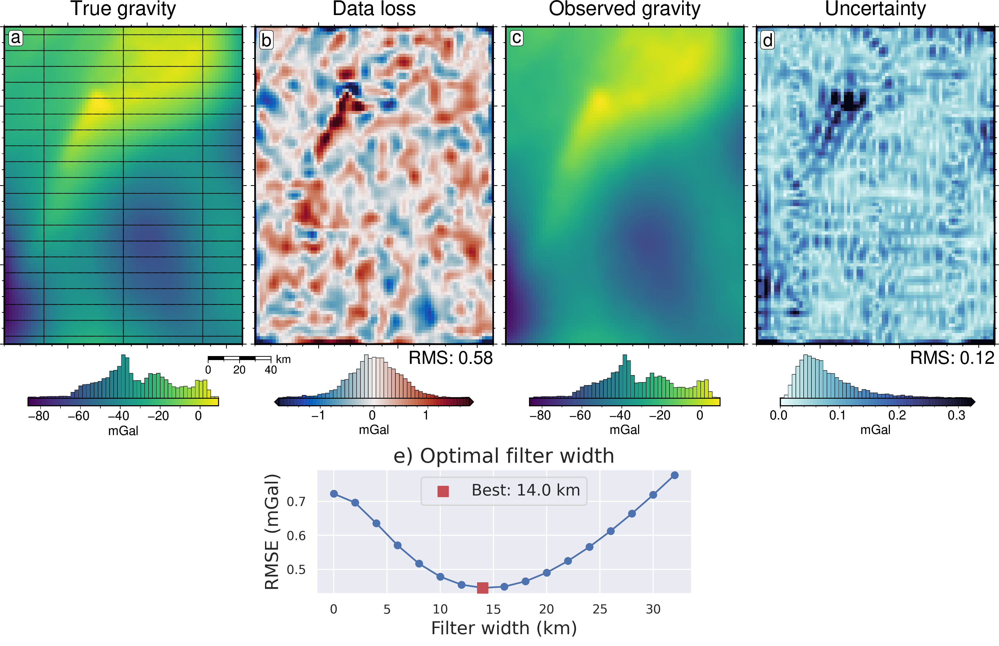

In [71]:
fig.image(
    imagefile=f"../tmp_outputs/Ross_Sea_0{i}_filters.png",
    position="n-2.1/-.3+jTL",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_error.png")
fig.show()

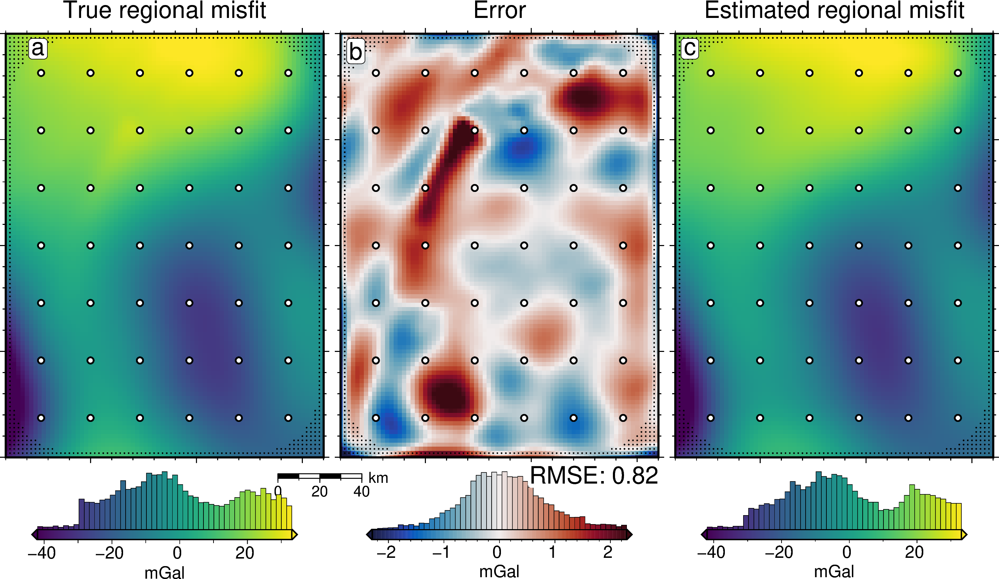

In [72]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_grid["true_reg"] = grav_grid.basement_grav

reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="viridis",
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.show()

In [73]:
# grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# lims = polar_utils.get_min_max(
#     grav_grid.gravity_anomaly_full_res,#_no_noise,
#     robust=True,
# )

# # plot the noise-free full res gravity
# fig = maps.plot_grd(
#     grav_grid.gravity_anomaly_full_res,#_no_noise,
#     fig_height=10,
#     cpt_lims=lims,
#     title="Full resolution noisy gravity",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
# )
# # plot observation points
# fig.plot(
#     grav_survey_df[["easting", "northing"]],
#     style="c.02c",
#     fill="black",
# )
# fig.text(
#     position="TL",
#     text="a",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )

# # plot the gravity error
# dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
# # dif = np.abs(dif)
# dif_lims = polar_utils.get_min_max(
#     dif,
#     absolute=True,
#     robust=True,
#     robust_percentiles=(0.01,0.99,)
# )
# # dif_lims = (0, polar_utils.get_min_max(dif, robust=True)[1])
# # dif_lims = (0, 1)

# fig = maps.plot_grd(
#     dif,
#     fig_height=10,
#     cmap="balance+h0",
#     cpt_lims=dif_lims,
#     title="Data loss",#f"Error, RMSE: {round(utils.rmse(dif),2)} mGal",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="xshift",
#     scalebar=True,
#     scalebar_position="jBL+o-.5c/-.6c",
# )
# # add mean / rms to plot
# fig.text(
#     position="BR",
#     justify="TL",
#     text=f"RMSE: {round(utils.rmse(dif),2)}",
#     fill="white",
#     font="14p,Helvetica,black",
#     offset="j-3c/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.text(
#     position="TL",
#     text="b",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )

# # plot the noisy interpolated gravity
# fig = maps.plot_grd(
#     grav_grid.gravity_anomaly,
#     fig_height=10,
#     cpt_lims=lims,
#     title="Sampled, gridded and filtered",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="xshift",
# )
# fig.text(
#     position="TL",
#     text="c",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot the eq source uncertainty
# fig = maps.plot_grd(
#     grav_grid.eqs_uncert,
#     fig_height=10,
#     # cmap="thermal",
#     cmap="ice",
#     reverse_cpt=True,
#     # robust=True,
#     # cpt_lims=dif_lims,
#     cpt_lims=(
#         0,
#         polar_utils.get_min_max(
#             grav_grid.eqs_uncert,
#             robust=True,
#         )[1],
#     ),
#     title=f"Uncertainty: RMS: {round(utils.rmse(grav_grid.eqs_uncert),2)}",
#     title_font="16p,Helvetica,black",
#     # cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.uncert),2)}",
#     # cbar_label=f"uncertainty (mGal), RMS: {round(utils.rmse(grav_grid.uncert),2)}",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="xshift",
# )
# fig.text(
#     position="TL",
#     text="d",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot the estimated regional
# # grav_grid["true_reg"] = (
# #     grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.bathymetry_grav
# # )
# grav_grid["true_reg"] = grav_grid.basement_grav

# reg_lims = polar_utils.get_combined_min_max(
#     [grav_grid.true_reg, grav_grid.reg],
#     robust=True,
# )
# fig = maps.plot_grd(
#     grav_grid.reg,
#     fig_height=10,
#     cmap="viridis",
#     cpt_lims=reg_lims,
#     title="Estimated regional misfit",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="both",
#     xshift_amount=-3,
#     yshift_amount=-.98,
#     points=constraint_points[~constraint_points.inside],
#     points_style="p1p",
# )
# fig.plot(
#     x=constraint_points[constraint_points.inside].easting,
#     y=constraint_points[constraint_points.inside].northing,
#     style="c.15c",
#     fill="white",
#     pen="1p,black",
# )
# # plot profiles location, and endpoints on map
# fig.plot(
#     vd.line_coordinates(profile_start, profile_end, size=100),
#     pen="2p,black",
# )
# fig.text(
#     x=profile_start[0],
#     y=profile_start[1],
#     text="A",
#     fill="white",
#     font="12p,Helvetica,black",
#     justify="CM",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.text(
#     x=profile_end[0],
#     y=profile_end[1],
#     text="A' ",
#     fill="white",
#     font="12p,Helvetica,black",
#     justify="CM",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.text(
#     position="TL",
#     text="e",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.6/.2",
#     clearance="+tO",
#     no_clip=True,
# )

# # plot the true regional misfit
# fig = maps.plot_grd(
#     grav_grid.true_reg,
#     fig_height=10,
#     cpt_lims=reg_lims,
#     cmap="viridis",
#     # robust=True,
#     title="True regional misfit",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="xshift",
#     points=constraint_points[~constraint_points.inside],
#     points_style="p1p",
# )
# fig.plot(
#     x=constraint_points[constraint_points.inside].easting,
#     y=constraint_points[constraint_points.inside].northing,
#     style="c.15c",
#     fill="white",
#     pen="1p,black",
# )
# fig.text(
#     position="TL",
#     text="f",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot the regional error
# dif = grav_grid.true_reg - grav_grid.reg
# dif_lims = (
#     0,
#     polar_utils.get_combined_min_max([grav_grid.reg_uncert, dif], robust=True)[1],
# )
# fig = maps.plot_grd(
#     dif,
#     fig_height=10,
#     # cmap="thermal",
#     # cpt_lims=dif_lims,
#     cmap="balance+h0",
#     cpt_lims=polar_utils.get_min_max(
#         dif,
#         absolute=True,
#         # robust=True,
#         # robust_percentiles=(0.01, 0.99),
#     ),
#     title="Regional error",
#     title_font="16p,Helvetica,black",
#     cbar_label=f"mGal",#, RMSE: {round(utils.rmse(dif),2)}",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="xshift",
#     points=constraint_points[~constraint_points.inside],
#     points_style="p1p",
# )
# # add mean / rms to plot
# fig.text(
#     position="BR",
#     justify="TL",
#     text=f"RMSE: {round(utils.rmse(dif),2)}",
#     fill="white",
#     font="14p,Helvetica,black",
#     offset="j-3c/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.plot(
#     x=constraint_points[constraint_points.inside].easting,
#     y=constraint_points[constraint_points.inside].northing,
#     style="c.15c",
#     fill="white",
#     pen="1p,black",
# )
# fig.text(
#     position="TL",
#     text="g",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot the regional uncertainty
# fig = maps.plot_grd(
#     grav_grid.reg_uncert,
#     fig_height=10,
#     # cpt_lims=dif_lims,
#     # cmap="thermal",
#     cmap="ice",
#     reverse_cpt=True,
#     cpt_lims=(0,
#         polar_utils.get_min_max(
#             grav_grid.reg_uncert,
#             robust=True,
#             # robust_percentiles=(0.01, 0.99),
#         )[1],
#     ),
#     # robust=True,
#     title="Regional uncertainty",
#     title_font="16p,Helvetica,black",
#     cbar_label=f"mGal",#, RMS: {round(utils.rmse(grav_grid.reg_uncert),2)}",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="xshift",
#     points=constraint_points[~constraint_points.inside],
#     points_style="p1p",
# )
# # add mean / rms to plot
# fig.text(
#     position="BR",
#     justify="TL",
#     text=f"RMSE: {round(utils.rmse(grav_grid.reg_uncert),2)}",
#     fill="white",
#     font="14p,Helvetica,black",
#     offset="j-3c/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.plot(
#     x=constraint_points[constraint_points.inside].easting,
#     y=constraint_points[constraint_points.inside].northing,
#     style="c.15c",
#     fill="white",
#     pen="1p,black",
# )
# fig.text(
#     position="TL",
#     text="h",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )

# # fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
# fig.show()

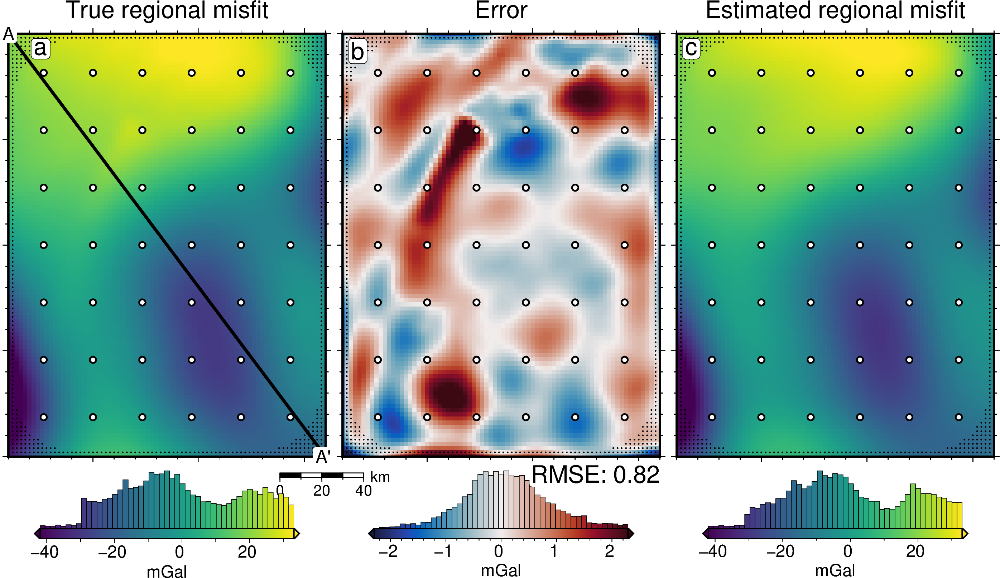

In [74]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_grid["true_reg"] = grav_grid.basement_grav

reg_lims = polar_utils.get_combined_min_max(
    [grav_grid.true_reg, grav_grid.reg],
    robust=True,
    robust_percentiles=(0.01, 0.99),
)
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="viridis",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
    scalebar=True,
    scalebar_position="jBR+o-.9c/-.6c",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = grav_grid.true_reg - grav_grid.reg
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(
        dif,
        absolute=True,
        robust=True,
        robust_percentiles=(0.01, 0.99),
    ),
    title="Error",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",  # f"mGal, RMSE: {round(utils.rmse(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
# add mean / rms to plot
fig.text(
    position="BR",
    justify="TR",
    text=f"RMSE: {round(utils.rmse(dif), 2)}",
    fill="white",
    font="16p,Helvetica,black",
    offset="j0c/.2",
    clearance="+tO",
    no_clip=True,
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="viridis",
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    fig=fig,
    origin_shift="x",
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)


# # plot the regional uncertainty
# fig = maps.plot_grd(
#     grav_grid.reg_uncert,
#     fig_height=10,
#     cmap="ice",
#     reverse_cpt=True,
#     cpt_lims=(0,
#         polar_utils.get_min_max(
#             grav_grid.reg_uncert,
#             robust=True,
#             robust_percentiles=(0.01, 0.99),
#         )[1],
#     ),
#     title="Uncertainty",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",#f"mGal, RMS: {round(utils.rmse(grav_grid.reg_uncert),2)}",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     fig=fig,
#     origin_shift="x",
#     points=constraint_points[~constraint_points.inside],
#     points_style="p1p",
# )
# # add mean / rms to plot
# fig.text(
#     position="BR",
#     justify="TR",
#     text=f"RMS: {round(utils.rmse(grav_grid.reg_uncert),2)}",
#     fill="white",
#     font="16p,Helvetica,black",
#     offset="j0c/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.plot(
#     x=constraint_points[constraint_points.inside].easting,
#     y=constraint_points[constraint_points.inside].northing,
#     style="c.15c",
#     fill="white",
#     pen="1p,black",
# )
# fig.text(
#     position="TL",
#     text="d",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )

# fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
fig.show()

    number       value             datetime_start          datetime_complete  \
0        0    0.646256 2025-03-10 14:33:07.457039 2025-03-10 14:33:07.734427   
2        2 -228.504279 2025-03-10 14:33:07.890968 2025-03-10 14:33:08.047144   
4        4    0.984270 2025-03-10 14:33:08.203418 2025-03-10 14:33:08.359212   
15      15    0.996282 2025-03-10 14:33:11.642182 2025-03-10 14:33:11.921220   
9        9    0.998196 2025-03-10 14:33:09.373821 2025-03-10 14:33:09.744809   
18      18    0.998600 2025-03-10 14:33:12.505458 2025-03-10 14:33:12.832405   
5        5    0.999378 2025-03-10 14:33:08.366932 2025-03-10 14:33:08.633921   
17      17    0.999201 2025-03-10 14:33:12.195176 2025-03-10 14:33:12.504405   
10      10    0.999045 2025-03-10 14:33:09.746105 2025-03-10 14:33:10.071586   
16      16    0.998869 2025-03-10 14:33:11.921977 2025-03-10 14:33:12.194288   
3        3    0.998242 2025-03-10 14:33:08.047930 2025-03-10 14:33:08.202454   
12      12    0.998999 2025-03-10 14:33:

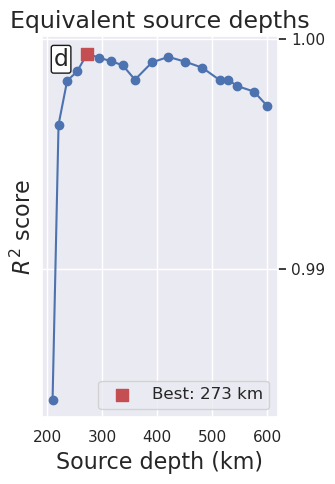

In [75]:
df = regional_study.trials_dataframe().sort_values("params_depth")
print(df)
df = df.iloc[2:].reset_index(drop=True)

_fig, ax = plt.subplots(figsize=(3.5, 5))
ax.plot(
    df.params_depth / 1e3,
    df.value,
    marker="o",
)

best_ind = df.value.idxmax()
ax.scatter(
    x=df.iloc[best_ind].params_depth / 1e3,
    y=df.iloc[best_ind].value,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(df.iloc[best_ind].params_depth / 1e3)} km",
)

ax.legend(fontsize=12)
ax.set_xlabel("Source depth (km)", fontsize=16)
ax.set_ylabel("$R^2$ score", fontsize=16)
ax.set_title("Equivalent source depths", fontsize=17)

ax.annotate(
    "d",
    xy=(0.05, 0.97),
    xycoords="axes fraction",
    fontsize=17,
    va="top",
    ha="left",
    bbox=dict(boxstyle="round,pad=0.1", facecolor="white", edgecolor="k", pad=3.0),
)

ax.set_yticks([0.99, 1])
ax.yaxis.tick_right()
ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter("%.2f"))

_fig.tight_layout()
_fig.savefig(
    f"../tmp_outputs/Ross_Sea_0{i}_eq_sources.png", dpi=300, bbox_inches="tight"
)

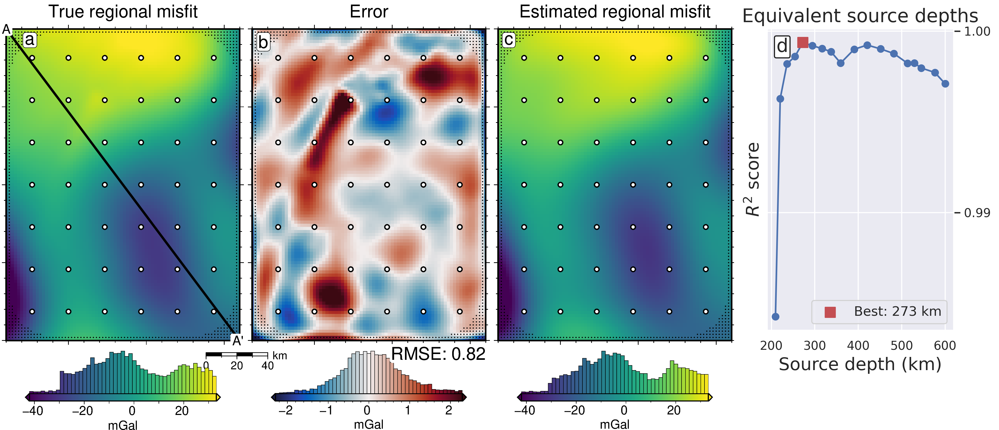

In [76]:
fig.image(
    imagefile=f"../tmp_outputs/Ross_Sea_0{i}_eq_sources.png",
    position="n1.01/.48+jML",
)
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies.png")
fig.show()

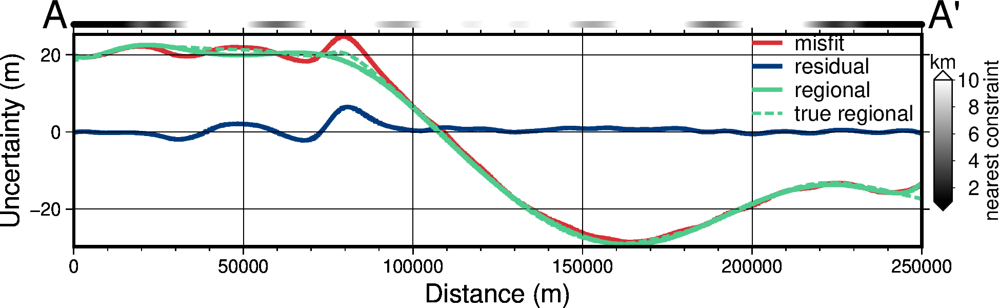

In [77]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_grid["true_reg"] = grav_grid.basement_grav

titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "78/203/141",  # green, 4ecb8d
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    # data_legend_loc="jTR+jTL+o1.5c/0c",
    # data_legend_box="+gwhite",
    data_legend_loc="jTR+o0c/-.2c",
    # data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lUncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["easting", "northing", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [1e3, 10e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig(f"../paper/figures/Ross_Sea_0{i}_grav_anomalies_profiles.png")
fig.show()

In [78]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)
grav_error.describe()

count    7676.000000
mean        0.410856
std         0.411883
min         0.000001
25%         0.144110
50%         0.308707
75%         0.549935
max         6.062156
dtype: float64

In [79]:
reg_error = np.abs(grav_df.basement_grav - grav_df.reg)
reg_error.describe()

count    7676.000000
mean        0.614941
std         0.535180
min         0.000350
25%         0.231389
50%         0.471082
75%         0.857107
max         6.104090
dtype: float64

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.


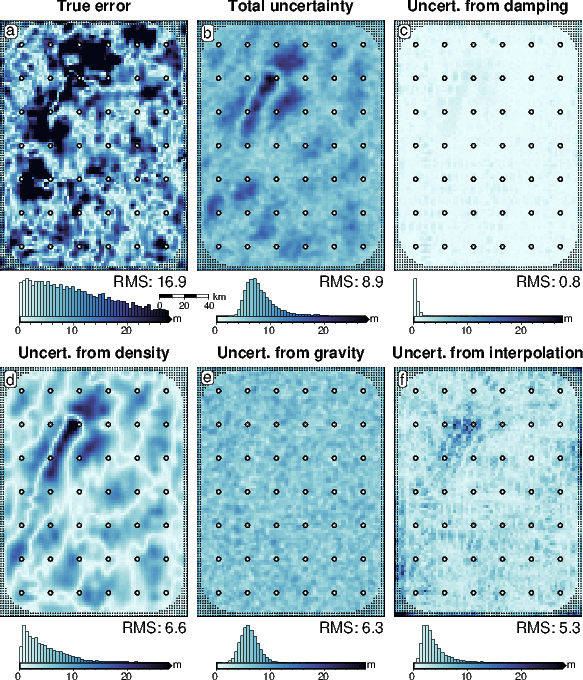

In [80]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    # "Uncert. from constraints",
    "Uncert. from gravity",
    "Uncert. from interpolation",
    # "Uncert. from regional",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))
grids = [
    np.abs(final_bathymetry - bathymetry),
    # np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    # sensitivity_ds.constraints_stdev,
    sensitivity_ds.grav_stdev,
    sensitivity_ds.eq_sources_stdev,
    # sensitivity_ds.regional_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=3,
    robust_percentiles=(0.005, 0.995),
    fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity.png",
)
# sensitivity_profile(
#     titles,
#     grids,
#     constraint_points=constraint_points,
#     data_ylims=[0, 45],
#     fname=f"../paper/figures/Ross_Sea_0{i}_sensitivity_profiles.png",
# )

# All together
## Damping CV's

0.014002832042252177
0.014060592918098937
0.014177018495326904
0.01343800976396253
0.013422423312811651


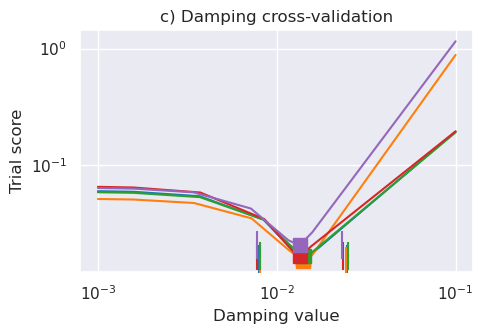

In [13]:
fig_c, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    0.2443699101356321,  # test 1
    0.23929672688818715,  # test 2
    0.24466078784954876,  # test 3
    0.24156679945478948,  # test 4
    0.23934002794701525,  # test 5
]

for i, j in enumerate(damping_studies):
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_damping.values
    param_name = "Damping"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot +/- stdev's
    best_damp = float(df.parameters.iloc[best])
    upper = float(10 ** (np.log10(best_damp) + stdevs[i]))
    lower = float(10 ** (np.log10(best_damp) - stdevs[i]))

    print(best_damp)
    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        label=f"Test {i + 1}) {inversion_titles[i]}",
        zorder=2,
    )
    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

ax.set_xscale("log")
ax.set_yscale("log")

# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# ax.legend(loc='upper right', fontsize=8)
ax.set_xlabel("Damping value")
ax.set_ylabel("Trial score")
ax.set_title("c) Damping cross-validation")

plt.tight_layout()
# plt.legend(fontsize=10)
# ax.legend(loc="upper left", fontsize=10)


plt.savefig(
    "../paper/figures/Ross_Sea_damping_cvs.png",
    dpi=300,
)

## Density optimizations

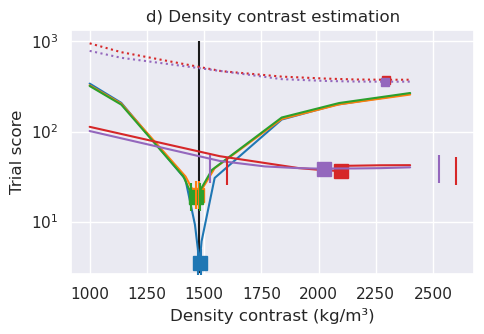

In [14]:
fig_b, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    5,  # test 1
    5,  # test 2
    20,  # test 3
    500,  # test 4
    500,  # test 5
]
for i, j in enumerate(density_studies):
    # if i == 0:
    #     pass
    # else:
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_density_contrast.values
    param_name = "Density"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        zorder=2,
        # xerr=stdevs[i],
        # capsize=10,
        # linestyle=None,
        # elinewidth=0,
        # # ecolor='k',
        # capthick=1.5,
    )

    # plot +/- stdev's
    upper = df.parameters.iloc[best] + stdevs[i]
    lower = df.parameters.iloc[best] - stdevs[i]

    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

    # plot K-Folds approach for Tests 4 and 5
    if i in [3, 4]:
        f = f"../results/Ross_Sea/Ross_Sea_0{i + 1}_density_cv_study.pickle"
        with pathlib.Path(f).open("rb") as f:
            r = pickle.load(f)

        scores = r.trials_dataframe().value.values
        parameters = r.trials_dataframe().params_density_contrast.values
        param_name = "Density"

        df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
        df = df0.sort_values(by="parameters")

        best = df.scores.argmin()

        color = sns.color_palette("tab10")[i]

        ax.plot(
            df.parameters,
            df.scores,
            color=color,
            linestyle="dotted",
        )

        # plot square for best value
        ax.plot(
            df.parameters.iloc[best],
            df.scores.iloc[best],
            "s",
            markersize=6,
            color=color,
            zorder=2,
        )

y_lims = ax.get_ylim()
ax.vlines(
    true_density_contrast,
    ymin=y_lims[0],
    ymax=y_lims[1],
    color="k",
    zorder=1,
    label="True density",
)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_xlabel("Density contrast (kg/m³)")
ax.set_ylabel("Trial score")
ax.set_title("d) Density contrast estimation")

plt.yscale("log")

plt.tight_layout()

plt.savefig(
    "../paper/figures/Ross_Sea_density_optimizations.png",
    dpi=300,
)

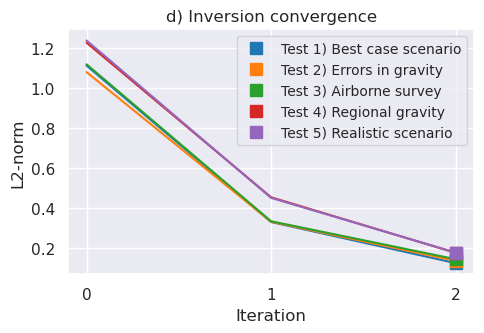

In [15]:
fig, ax1 = plt.subplots(figsize=(5, 3.5))

for i, j in enumerate(optimal_results):
    grav_results = j[1]
    params = j[2]

    # get misfit data at end of each iteration
    cols = [s for s in grav_results.columns.to_list() if "_final_misfit" in s]
    iters = len(cols)

    l2_norms = [np.sqrt(utils.rmse(grav_results[i])) for i in cols]
    starting_misfit = utils.rmse(grav_results["iter_1_initial_misfit"])
    starting_l2_norm = np.sqrt(starting_misfit)

    # add starting l2 norm to the beginning of the list
    l2_norms.insert(0, starting_l2_norm)

    # calculate delta L2-norms
    delta_l2_norms = []
    for k, m in enumerate(l2_norms):
        if k == 0:
            delta_l2_norms.append(np.nan)
        else:
            delta_l2_norms.append(l2_norms[k - 1] / m)

    # get tolerance values
    l2_norm_tolerance = float(params["L2 norm tolerance"])
    delta_l2_norm_tolerance = float(params["Delta L2 norm tolerance"])

    color = sns.color_palette("tab10")[i]

    # plot L2-norm convergence
    ax1.plot(
        range(iters + 1),
        l2_norms,
        color=color,
        # label=inversion_titles[i],
    )
    # plot square for end iteration
    ax1.plot(
        iters,
        l2_norms[-1],
        "s",
        markersize=8,
        color=color,
        zorder=2,
        label=f"Test {i + 1}) {inversion_titles[i]}",
    )
# set x axis to integer values
ax1.xaxis.set_major_locator(mpl.ticker.MaxNLocator(integer=True))

ax1.legend(loc="upper right", fontsize=10)

# set axis labels, ticks and gridlines
ax1.set_xlabel("Iteration")
ax1.set_ylabel("L2-norm")
ax1.tick_params(axis="y", which="both")
plt.title("d) Inversion convergence")
plt.tight_layout()
plt.savefig(
    "../paper/figures/Ross_Sea_convergences.png",
    dpi=300,
)
plt.show()

## Power spectrum

In [16]:
dif_grids = []
for g in final_bathymetries:
    # for g in final_stochastic_means:
    dif_grids.append(bathymetry - g)

# use combined min max
# dif_lims = polar_utils.get_combined_min_max(dif_grids, robust=True)

# use quartiles for combined min/max
# mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# dif_lims = mins.quantile(.25), maxes.quantile(.75)

# set min max as 2nd to last grid
dif_lims = polar_utils.get_min_max(dif_grids[-2], robust=True)

dif_lims

(np.float64(-18.46557827590709), np.float64(12.261152548104803))

INFO:invert4geom:Standard deviation used for noise: [50.0]
INFO:polartoolkit:changing grid spacing
INFO:invert4geom:Standard deviation used for noise: [50.0]
INFO:polartoolkit:changing grid spacing
INFO:invert4geom:Standard deviation used for noise: [50.0]
INFO:polartoolkit:changing grid spacing


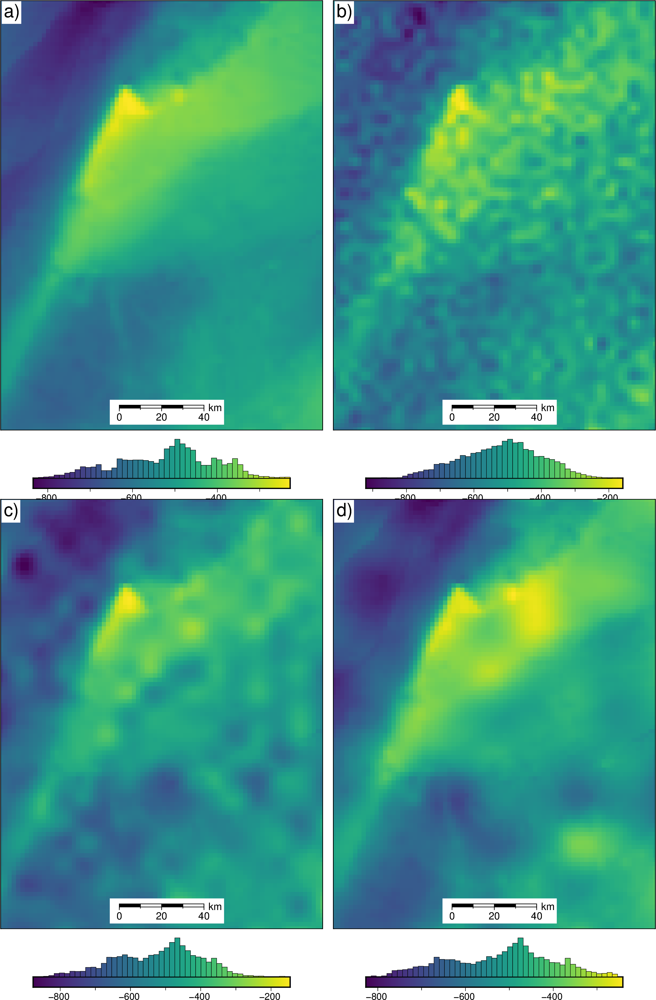

makecpt [ERROR]: Option T: min >= max
ERROR:polartoolkit:Module 'makecpt' failed with status code 72:
makecpt [ERROR]: Option T: min >= max
Traceback (most recent call last):
  File "/home/sungw937/polartoolkit/src/polartoolkit/maps.py", line 1026, in set_cmap
    pygmt.makecpt(
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/helpers/decorators.py", line 595, in new_module
    return module_func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/helpers/decorators.py", line 758, in new_module
    return module_func(*bound.args, **bound.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/src/makecpt.py", line 164, in makecpt
    lib.call_module(module="makecpt", args=build_arg_list(kwargs, outfile=output))
  Fi

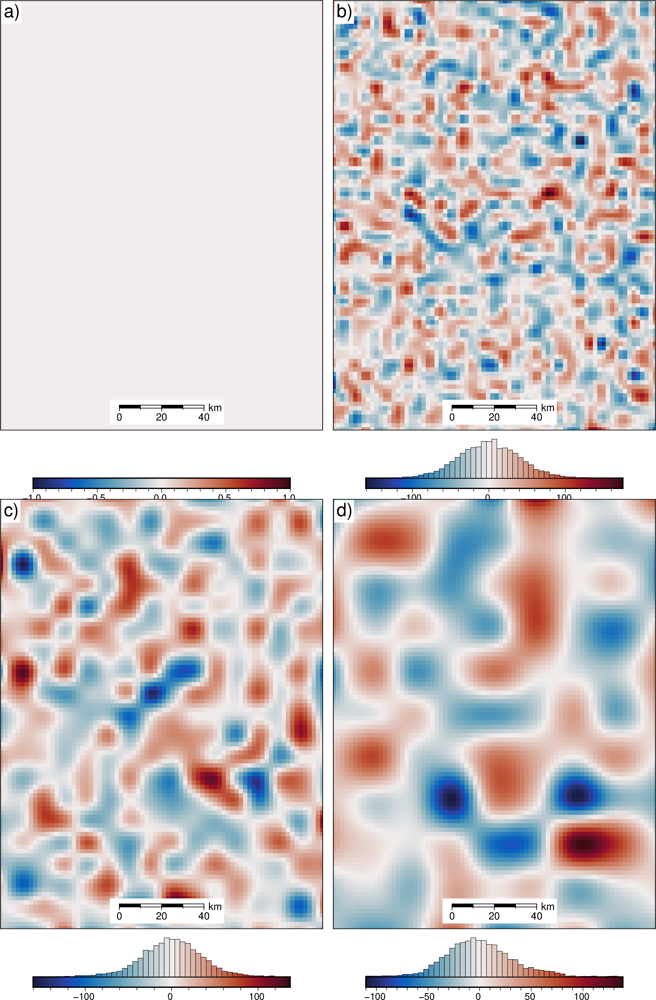

In [17]:
names = ["true", 5, 10, 20]

true = bathymetry
# true =  xr.ones_like(bathymetry)*100
grids = [
    true,
    *[
        inv_synthetic.contaminate_with_long_wavelength_noise(
            true,
            coarsen_factor=None,
            spacing=x * 1e3,
            noise_as_percent=False,
            noise=50,
        )
        for x in names[1:]
    ],
]

fig = maps.subplots(
    grids,
    hist=True,
    cmap="viridis",
    scalebar=True,
)
fig.show()

fig = maps.subplots(
    [g - true for g in grids],
    hist=True,
    cmap="balance+h0",
    scalebar=True,
)
fig.show()

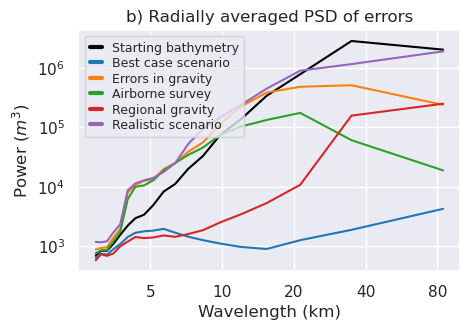

In [18]:
names = [
    "Starting bathymetry",
    *[inversion_titles[i] for i in range(len(dif_grids))],
]

grids = [
    bathymetry - starting_bathymetry,
    *dif_grids,
]

raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            # detrend='constant',
            detrend="linear",
            # window=False,
            # nfactor=4,
            # spacing_tol=0.01,
            # nfactor=3,
            truncate=False,
        )
    )

fig_b, ax = plt.subplots(figsize=(5, 3.5))

for i, da in enumerate(raps_das):
    c = "black" if i == 0 else sns.color_palette("tab10")[i - 1]

    ax.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=c,
    )

ax.set_xscale("log")
ax.set_yscale("log")
leg = ax.legend(
    loc="upper left",
    fontsize=9,
    labelspacing=0.2,
    handlelength=1,
)

for legobj in leg.legend_handles:
    legobj.set_linewidth(3)

ax.set_xlabel("Wavelength (km)")
ax.set_ylabel("Power ($m^3$)")
ax.set_title("b) Radially averaged PSD of errors")
plt.tight_layout()

ax.set_xticks(
    [
        # 2,
        5,
        10,
        20,
        40,
        80,
    ]
)
ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.0f}"))

# plt.savefig(
#     "../paper/figures/Ross_Sea_inversion_errors_RAPSD.png",
#     dpi=300,
# )

## Inversion results

In [19]:
# stochastic_dif_grids = []
# for g in final_stochastic_means:
#     stochastic_dif_grids.append(bathymetry - g)

# # use combined min max
# # dif_lims = polar_utils.get_combined_min_max(dif_grids, robust=True)

# # use quartiles for combined min/max
# # mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# # maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# # dif_lims = mins.quantile(.25), maxes.quantile(.75)

# # set min max as 2nd to last grid
# stochastic_dif_lims = polar_utils.get_min_max(stochastic_dif_grids[-2], robust=True)

# stochastic_dif_lims

In [20]:
# use combined min max
inversion_error_lims = (
    0,
    polar_utils.get_combined_min_max(abs_inversion_errors, robust=True)[1],
)
# uncert_error_lims = polar_utils.get_combined_min_max(uncert_errors, robust=True)

# use quartiles for combined min/max
# mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# dif_lims = mins.quantile(.25), maxes.quantile(.75)

# set min max as 2nd to last grid
uncert_error_lims = polar_utils.get_min_max(uncert_errors[-2], robust=True)

inversion_error_lims, uncert_error_lims

((0, np.float64(58.217226990140745)),
 (np.float64(-6.895856201980633), np.float64(12.545166888531407)))

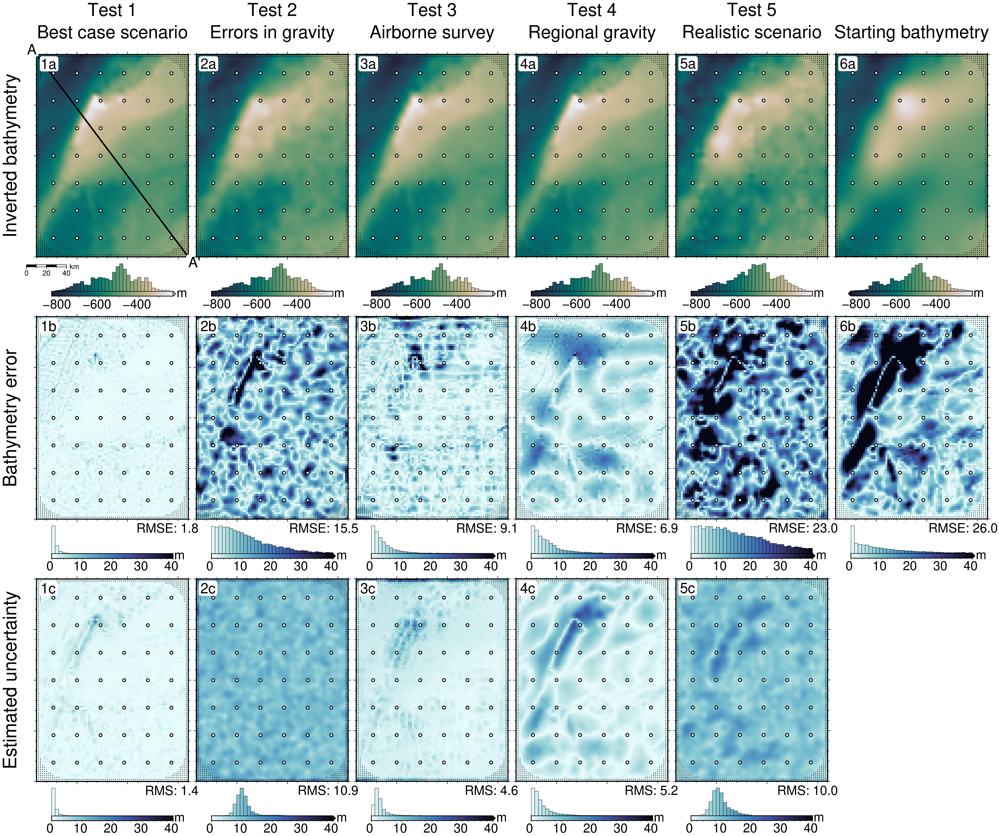

In [33]:
inversion_MAEs = []
inversion_RMSEs = []
uncert_MAEs = []
uncert_RMSEs = []
uncert_MAs = []
uncert_RMSs = []

constraint_points = constraint_points_dfs[0]

titles = [*inversion_titles, "Starting bathymetry"]

# set cmap lims
bathy_lims = polar_utils.get_min_max(
    bathymetry,
    # robust=True,
    # robust_percentiles=(0.01, 0.99),
)
bathy_error_lims = (
    0,
    polar_utils.get_combined_min_max(
        np.abs([*dif_grids, bathymetry - starting_bathymetry]),
        robust=True,
        # absolute=True,
        robust_percentiles=(0.07, 0.93),
    )[1],
)
uncert_lims = (
    0,
    polar_utils.get_combined_min_max(
        final_uncertainties,
        robust=True,
        robust_percentiles=(0.005, 0.995),
    )[1],
)

bathy_error_lims = (0, 40)
uncert_lims = bathy_error_lims

grds = [*final_bathymetries, starting_bathymetry]
for i, grd in enumerate(grds):
    if i == 0:
        fig = None
        origin_shift = "initialize"
        scalebar = True
    else:
        origin_shift = "both_shift"
        scalebar = False

    if i == len(grds) - 1:
        uncert_grd = None
        bathy_dif = bathymetry - grd
    else:
        uncert_grd = final_uncertainties[i]
        bathy_dif = dif_grids[i]

    yshift_amount = 1.05

    # plot the inverted bathymetry
    fig = maps.plot_grd(
        grd,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=bathy_lims,
        cbar_unit="m",
        cbar_font="28p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=35,
        fig=fig,
        origin_shift=origin_shift,
        yshift_amount=2 * yshift_amount,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
        scalebar=scalebar,
        scalebar_position="jBL+o-.5c/-.6c",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add title to each column
    fig.text(
        position="TC",
        justify="BC",
        text=titles[i],
        fill="white",
        font="25p,Helvetica,black",
        clearance="+tO",
        offset="j0/.8",
        no_clip=True,
    )
    if i == len(grds) - 1:
        pass
    else:
        fig.text(
            position="TC",
            justify="BC",
            text=f"Test {i + 1}",
            fill="white",
            font="25p,Helvetica,black",
            clearance="+tO",
            offset="j0/1.9",
            no_clip=True,
        )

    if i == 0:
        # add title to top row
        fig.text(
            position="ML",
            justify="BC",
            offset="j0/1",
            text="Inverted bathymetry",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )
        # plot profiles location, and endpoints on map
        fig.plot(
            vd.line_coordinates(profile_start, profile_end, size=100),
            pen="2p,black",
        )
        fig.text(
            x=profile_start[0],
            y=profile_start[1],
            text="A",
            fill="white",
            font="20p,Helvetica,black",
            justify="BR",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=profile_end[0],
            y=profile_end[1],
            text="A' ",
            fill="white",
            font="20p,Helvetica,black",
            justify="TL",
            clearance="+tO",
            no_clip=True,
        )

    # plot subplot labels (1a, 1b, 1c, etc.)
    fig.text(
        position="TL",
        text=f"{i + 1}a",
        fill="white",
        font="20p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )

    inversion_MAE = np.abs(bathy_dif).values.mean()
    inversion_RMSE = utils.rmse(bathy_dif)
    # stochastic_inversion_MAE = np.abs(stochastic_dif_grids[i]).values.mean()

    # add to lists
    inversion_MAEs.append(inversion_MAE)
    inversion_RMSEs.append(inversion_RMSE)

    # bathy_error_lims = polar_utils.get_min_max(
    #     np.abs(bathy_dif),
    #     robust=True,
    #     robust_percentiles=(0.01, 0.99),
    # )
    # plot bathymetry error
    fig = maps.plot_grd(
        np.abs(bathy_dif),
        fig_height=10,
        # cmap="balance+h0",
        cmap="ice",
        reverse_cpt=True,
        cpt_lims=bathy_error_lims,
        cbar_unit="m",
        cbar_font="28p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=35,
        fig=fig,
        origin_shift="y",
        yshift_amount=-yshift_amount,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add errors to plot
    fig.text(
        position="BR",
        justify="TR",
        text=f"RMSE: {round(inversion_RMSE, 1)}",
        fill="white",
        font="18p,Helvetica,black",
        offset="j-.5/.2",
        clearance="+tO",
        no_clip=True,
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i + 1}b",
        fill="white",
        font="20p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 2nd row
        fig.text(
            position="ML",
            justify="BC",
            offset="j0/1",
            text="Bathymetry error",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

    # plot the uncertainty
    if i == len(grds) - 1:
        uncert_MA = None
        uncert_RMS = None
        uncert_MAE = None
        uncert_RMSE = None
    else:
        uncert_MA = np.abs(uncert_grd.values).mean()
        uncert_RMS = utils.rmse(uncert_grd)
        uncert_MAE = np.abs(uncert_errors[i]).values.mean()
        uncert_RMSE = utils.rmse(uncert_errors[i])

    uncert_MAs.append(uncert_MA)
    uncert_RMSs.append(uncert_RMS)
    uncert_MAEs.append(uncert_MAE)
    uncert_RMSEs.append(uncert_RMSE)

    if i == len(grds) - 1:
        continue

    fig = maps.plot_grd(
        uncert_grd,
        fig_height=10,
        cmap="ice",
        reverse_cpt=True,
        cpt_lims=uncert_lims,
        cbar_unit="m",
        cbar_font="28p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=35,
        fig=fig,
        origin_shift="y",
        yshift_amount=-yshift_amount,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add mean / rms to plot
    fig.text(
        position="BR",
        justify="TR",
        text=f"RMS: {round(uncert_RMS, 1)}",
        fill="white",
        font="18p,Helvetica,black",
        offset="j-.5/.2",
        clearance="+tO",
        no_clip=True,
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i + 1}c",
        fill="white",
        font="20p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 3rd row
        fig.text(
            position="ML",
            justify="BC",
            offset="j0/1",
            text="Estimated uncertainty",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

fig.savefig("../paper/figures/Ross_Sea_inversions.png", dpi=500)

fig.show()

## Sensitivity results

In [22]:
# plots_in_row = []
# for column, final_bathymetry in enumerate(final_bathymetries):
#     # get data for each test
#     sensitivity_ds = sensitivity_results[column]
#     # if column == 0:
#     #     titles = [
#     #         "True error",
#     #         "Total uncertainty",
#     #     ]
#     #     grids=[
#     #         np.abs(final_bathymetry - bathymetry),
#     #         final_uncertainties[column],
#     #     ]
#     #     constraint_points = constraint_points_dfs[column]
#     #     plots_in_row.append(len(grids))
#     if column == 0:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 1:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from gravity",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.gravity_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 2:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from interpolation",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds["equivalent source gridding_stdev"],
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 3:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             # "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             # sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 4:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             # "Uncert. from constraints",
#             # "Uncert. from gravity",
#             "Uncert. from interpolation",
#             # "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             # sensitivity_ds.constraints_stdev,
#             # sensitivity_ds.grav_stdev,
#             sensitivity_ds["eq_sources_stdev"],
#             # sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))

#     # clip each grid to region of interest
#     grids = [g.sel(
#             easting=slice(plot_region[0], plot_region[1]),
#             northing=slice(plot_region[2], plot_region[3]),
#         ) for g in grids]

#     cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

#     # plot specs
#     yshift_amount = -.98
#     fig_height = 8

#     first_column = True
#     for row, g in enumerate(grids):
#         if row == 0:
#             origin_shift = "both_shift"
#             yshift_amount = -(plots_in_row[column-1]-1)*yshift_amount
#             scalebar=True
#             if column == 0:
#                 origin_shift="initialize"
#                 fig=None
#                 scalebar=True
#         else:
#             origin_shift = "y"
#             scalebar=False

#         fig = maps.plot_grd(
#             grid=g,
#             fig_height=fig_height,
#             # title=titles[row],
#             # title_font="16p,Helvetica,black",
#             cmap="thermal",
#             cpt_lims = cpt_lims,
#             cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
#             cbar_font="18p,Helvetica,black",
#             hist=True,
#             hist_bin_num=35,
#             fig=fig,
#             origin_shift=origin_shift,
#             yshift_amount=yshift_amount,
#             scalebar=scalebar,
#             scalebar_position="jBR+o0c/-.6c",
#         )
#         if constraint_points is not None:
#             fig.plot(
#                 x=constraint_points.easting,
#                 y=constraint_points.northing,
#                 style="x.2c",
#                 fill="white",
#                 pen="1.5p,white",
#             )
#         fig.text(
#             position="TL",
#             text=f"{string.ascii_lowercase[row]}",
#             fill="white",
#             pen=True,
#             font="16p,Helvetica,black",
#             offset="j.6/.2",
#             clearance="+tO",
#             no_clip=True,
#         )
#         if row == 0:
#             if column == 0:
#                 # plot profiles location, and endpoints on map
#                 fig.plot(
#                     vd.line_coordinates(profile_start, profile_end, size=100),
#                     pen="2p,black",
#                 )
#                 fig.text(
#                     x=profile_start[0],
#                     y=profile_start[1],
#                     text="A",
#                     fill="white",
#                     font="12p,Helvetica,black",
#                     justify="CM",
#                     clearance="+tO",
#                     no_clip=True,
#                 )
#                 fig.text(
#                     x=profile_end[0],
#                     y=profile_end[1],
#                     text="A' ",
#                     fill="white",
#                     font="12p,Helvetica,black",
#                     justify="CM",
#                     clearance="+tO",
#                     no_clip=True,
#                 )
#             # add title to each column
#             fig.text(
#                 y = plot_region[3]+40e3,
#                 x = np.mean([plot_region[0],plot_region[1]]),
#                 justify="TC",
#                 text = inversion_titles[column],
#                 fill = 'white',
#                 font = '26p,Helvetica,black',
#                 clearance = '+tO',
#                 no_clip=True,
#             )
#         if first_column is True:
#             # add title to each row
#             fig.text(
#                 x = plot_region[0]-30e3,
#                 y = np.mean([plot_region[2],plot_region[3]]),
#                 justify="BC",
#                 text = titles[row],
#                 fill = 'white',
#                 angle = 90,
#                 font = '26p,Helvetica,black',
#                 clearance = '+tO',
#                 no_clip=True,
#             )
#         first_column=False
#     # if fname is not None:
#         # fig.savefig(fname)
# fig.show()

In [23]:
# plots_in_row = []
# for i, final_bathymetry in enumerate(final_bathymetries):

#     # get data for each test
#     sensitivity_ds = sensitivity_results[i]

#     if i == 0:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 1:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 2:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             # "Uncert. from gravity",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             # sensitivity_ds.gravity_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 3:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from interpolation",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds["equivalent source gridding_stdev"],
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 4:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 5:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#             # "Uncert. from gravity",
#             "Uncert. from interpolation",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#             # sensitivity_ds.grav_stdev,
#             sensitivity_ds["eq_sources_stdev"],
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))

#     # clip each grid to region of interest
#     grids = [
#         g.sel(
#             easting=slice(plot_region[0], plot_region[1]),
#             northing=slice(plot_region[2], plot_region[3]),
#         )
#         for g in grids
#     ]

#     first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
#     # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

#     # plot specs
#     # origin_shift = "both_shift"
#     # scalebar=False
#     yshift_amount = -1.005
#     xshift_amount = 1
#     fig_height = 7

#     for x, g in enumerate(grids):
#         if x == 0:
#             origin_shift = "both_shift"
#             # try:
#             xshift_amount = -(plots_in_row[i-1] - 1) * xshift_amount
#             # except:
#             #     pass
#             scalebar = True
#             if i == 0:
#                 origin_shift = "initialize"
#                 fig = None
#         else:
#             origin_shift = "xshift"
#             scalebar = False
#             xshift_amount = 1
#         if x < 2:
#             cpt_lims = first_2_lims
#         else:
#             cpt_lims = polar_utils.get_min_max(g, robust=True)

#         fig = maps.plot_grd(
#             grid=g,
#             fig_height=fig_height,
#             # title=titles[x],
#             # title_font="16p,Helvetica,black",
#             cmap="thermal",
#             cpt_lims=cpt_lims,
#             cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
#             cbar_font="18p,Helvetica,black",
#             hist=True,
#             hist_bin_num=50,
#             # cbar_yoffset=1,
#             fig=fig,
#             origin_shift=origin_shift,
#             xshift_amount=xshift_amount,
#             yshift_amount=yshift_amount,
#             scalebar=scalebar,
#             scalebar_position="jBR+o0c/-.6c",
#         )
#         if constraint_points is not None:
#             fig.plot(
#                 x=constraint_points.easting,
#                 y=constraint_points.northing,
#                 style="x.2c",
#                 fill="white",
#                 pen="1.5p,white",
#             )
#         fig.text(
#             position="TL",
#             text=f"{string.ascii_lowercase[x]}",
#             fill="white",
#             pen=True,
#             font="16p,Helvetica,black",
#             offset="j.6/.2",
#             clearance="+tO",
#             no_clip=True,
#         )
#         if x == 0:
#             # plot profiles location, and endpoints on map
#             fig.plot(
#                 vd.line_coordinates(profile_start, profile_end, size=100),
#                 pen="2p,black",
#             )
#             fig.text(
#                 x=profile_start[0],
#                 y=profile_start[1],
#                 text="A",
#                 fill="white",
#                 font="12p,Helvetica,black",
#                 justify="CM",
#                 clearance="+tO",
#                 no_clip=True,
#             )
#             fig.text(
#                 x=profile_end[0],
#                 y=profile_end[1],
#                 text="A' ",
#                 fill="white",
#                 font="12p,Helvetica,black",
#                 justify="CM",
#                 clearance="+tO",
#                 no_clip=True,
#             )
#             # add title to each row
#             fig.text(
#                 x=plot_region[0] - 30e3,
#                 y=np.mean([plot_region[2], plot_region[3]]),
#                 justify="BC",
#                 text=inversion_titles[i],
#                 fill="white",
#                 angle=90,
#                 font="26p,Helvetica,black",
#                 clearance="+tO",
#                 no_clip=True,
#             )
#         if i == len(final_bathymetries) - 1:
#             # add title to each column
#             fig.text(
#                 y=plot_region[2] - 40e3,
#                 x=np.mean([plot_region[0], plot_region[1]]),
#                 justify="TC",
#                 text=titles[x],
#                 fill="white",
#                 font="26p,Helvetica,black",
#                 clearance="+tO",
#                 no_clip=True,
#             )

#     # if fname is not None:
#     # fig.savefig(fname)
# fig.show()

## Inversion result plots

In [24]:
hexs = sns.color_palette("tab10").as_hex()[:]
rgbs = [PIL.ImageColor.getrgb(h) for h in hexs]
colors = [f"{r[0]}/{r[1]}/{r[2]}" for r in rgbs]

In [25]:
inversion_titles

['Best case scenario',
 'Errors in gravity',
 'Airborne survey',
 'Regional gravity',
 'Realistic scenario']

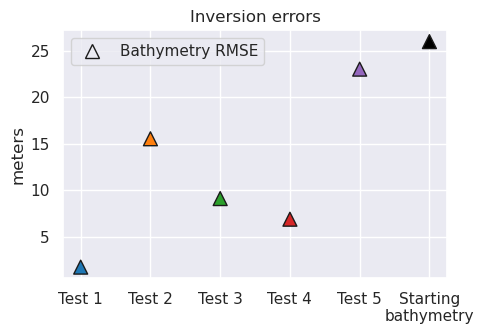

In [26]:
titles = [
    "Test 1",
    "Test 2",
    "Test 3",
    "Test 4",
    "Test 5",
    "Starting\nbathymetry",
]
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "title": titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs) - 1] + ["black"],
    }
)

fig_a, ax1 = plt.subplots(figsize=(5, 3.5))

ax1.scatter(
    data=df,
    x="title",
    y="inversion_RMSE",
    color=df.color,
    marker="^",
    s=100,
    edgecolor="k",
)

ax1.set_ylabel("meters")

plt.title("Inversion errors")

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry RMSE",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
plt.legend(handles=[inversion_label])

plt.tight_layout()

plt.show()

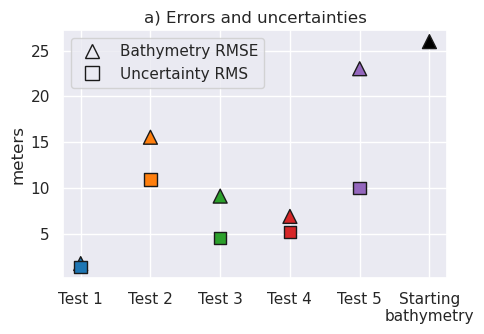

In [27]:
# titles = [
#     'Test1\nBest case scenario',
#     'Test2\nErrors in gravity',
#     'Test3\nAirborne survey',
#     'Test4\nRegional gravity',
#     'Test5\nRealistic scenario',
#     "Starting bathymetry",
# ]
titles = [
    "Test 1",
    "Test 2",
    "Test 3",
    "Test 4",
    "Test 5",
    "Starting\nbathymetry",
]
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "uncertainty_RMSE": uncert_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "uncertainty_MAE": uncert_MAEs,
        "uncertainty_MAs": uncert_MAs,
        "uncertainty_RMSs": uncert_RMSs,
        "title": titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs) - 1] + ["black"],
    }
)

fig_a, ax1 = plt.subplots(figsize=(5, 3.5))

# ax1.scatter(
#     data=df,
#     x="title",
#     y="uncertainty_RMSE",
#     color=df.color,
#     marker="s",
#     s=100,
#     edgecolor="k",
# )
ax1.scatter(
    data=df,
    x="title",
    y="inversion_RMSE",
    color=df.color,
    marker="^",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_RMSs",
    color=df.color,
    marker="s",
    s=80,
    edgecolor="k",
)

# ax1.annotate(
#     "Starting bathymetry",
#     (
#         df[df.title == "Starting\nbathymetry"].title.values[0],
#         df[df.title == "Starting\nbathymetry"].inversion_RMSE.values[0],
#     ),
#     xycoords="data",
#     xytext=(-110, -30),
#     textcoords="offset points",
#     arrowprops=dict(arrowstyle="-", color="black"),
# )

ax1.set_ylabel("meters")

# # ax1.set_xticks(ax1.get_xticks())
# ax1.set_xticklabels(
#     ax1.get_xticklabels(),
#     rotation=20,
#     ha="center",
#     va="top",
#     fontsize=12,
# )

# ax1.set_xticks([])

plt.title("a) Errors and uncertainties")

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry RMSE",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
# # uncert_label = mpl.lines.Line2D(
# #     [0],
# #     [0],
# #     label="Uncertainty error",
# #     marker="s",
# #     markersize=10,
# #     markeredgecolor="k",
# #     markerfacecolor="none",
# #     linestyle="",
# # )
uncert_mean_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty RMS",
    marker="s",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
plt.legend(handles=[inversion_label, uncert_mean_label])


plt.tight_layout()

plt.savefig(
    "../paper/figures/Ross_Sea_inversion_errors.png",
    dpi=300,
)
plt.show()

In [28]:
df.inversion_RMSE - df.uncertainty_RMSs

0     0.385885
1     4.629030
2     4.555881
3     1.714281
4    13.027453
5          NaN
dtype: float64

In [29]:
inversion_titles

['Best case scenario',
 'Errors in gravity',
 'Airborne survey',
 'Regional gravity',
 'Realistic scenario']

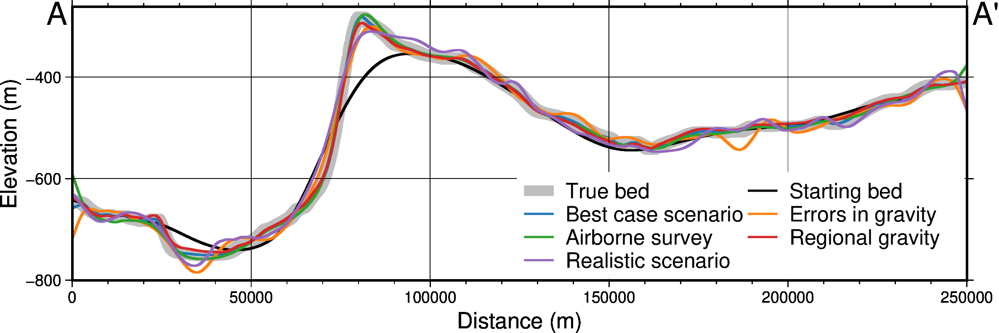

In [30]:
# topography dictionary
topo_names = ["True bed", "Starting bed", *inversion_titles]
topo_grids = [bathymetry, starting_bathymetry, *final_bathymetries]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        "gray",
        "black",
        *colors,
        # "216/48/52", # red, d83034
        # "0/58/125", # dark blue, 003a7d
        # "78/203/141", # green, 4ecb8d
        # "255/157/58", # orange, ff9d3a
        # "199/1/255", # purple, c701ff
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=5.5,
    fig_width=18,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.03,
    # layers_ylims=[-700, -200],
    # layers_legend_loc="jTR+jTL+o0c/0c",
    layers_legend_loc="jBR+jBR+o.05c/.03c+w9c",
    layers_legend_box=["+gwhite"],
    layers_legend_columns=2,
    layers_legend_font="12p,Helvetica,black",
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lElevation (m)"],
    layers_pen_thickness=[6, 1.2, *[1.2] * len(inversion_titles)],
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
    start_label_justify="TR",
    end_label_justify="TL",
    start_end_fill=None,
)
fig.savefig("../paper/figures/Ross_Sea_inversion_profiles.png", dpi=500)
fig.show()

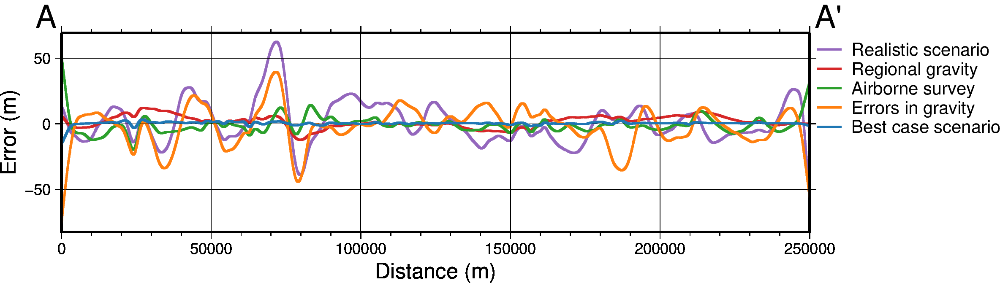

In [31]:
# topography dictionary
topo_names = inversion_titles[::-1]
topo_grids = [x - bathymetry for x in final_bathymetries][::-1]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        *colors[0 : len(topo_grids)][::-1],
        # "216/48/52", # red, d83034
        # "0/58/125", # dark blue, 003a7d
        # "78/203/141", # green, 4ecb8d
        # "255/157/58", # orange, ff9d3a
        # "199/1/255", # purple, c701ff
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=4,
    fig_width=15,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.05,
    # layers_ylims=[-700, -200],
    layers_legend_loc="jTR+jTL+o0c/0c",
    layers_legend_box=None,
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lError (m)"],
    layers_pen_thickness=[1.2] * len(inversion_titles),
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
)
# fig.savefig("../paper/figures/Ross_Sea_inversion_profiles.png", dpi=500)
fig.show()

## Inversion results subplot

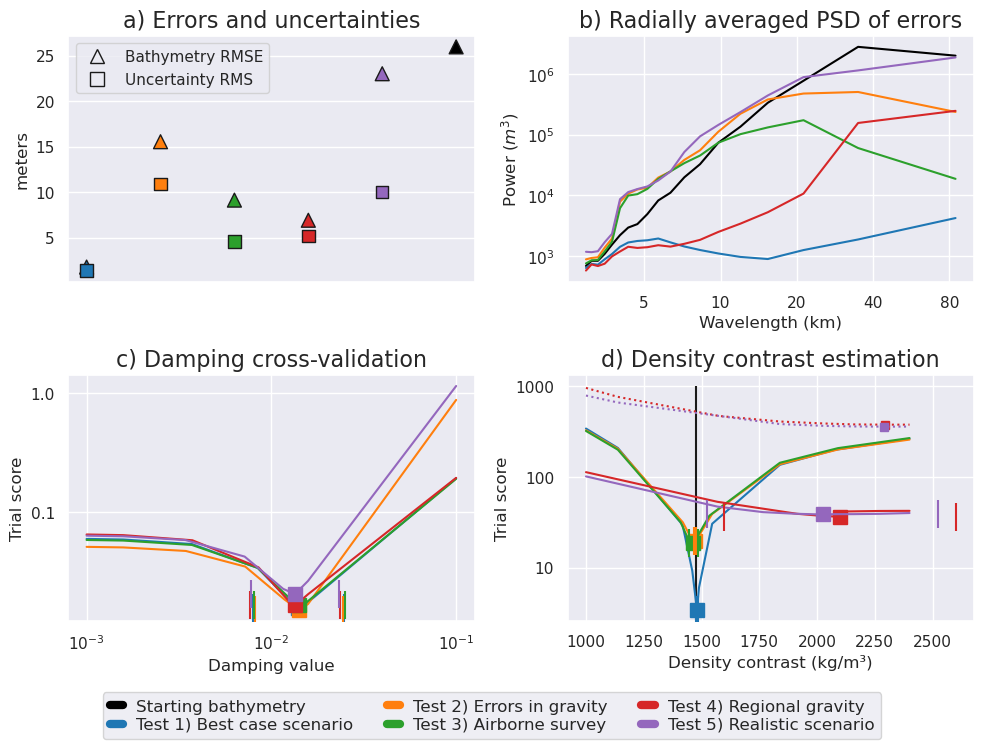

In [32]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    2,
    2,
    figsize=(5 * 2, 3.5 * 2),
)
# plt.subplots_adjust(wspace=.2, hspace=.8)

###
###
# Errors and uncertainties
###
###

titles = [
    "Test 1",
    "Test 2",
    "Test 3",
    "Test 4",
    "Test 5",
    "Starting\nbathymetry",
]
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "uncertainty_RMSE": uncert_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "uncertainty_MAE": uncert_MAEs,
        "uncertainty_MAs": uncert_MAs,
        "uncertainty_RMSs": uncert_RMSs,
        "title": titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs) - 1] + ["black"],
    }
)

ax1.scatter(
    data=df,
    x="title",
    y="inversion_RMSE",
    color=df.color,
    marker="^",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_RMSs",
    color=df.color,
    marker="s",
    s=80,
    edgecolor="k",
)

ax1.set_ylabel("meters")
ax1.set_xticks([])
ax1.set_title("a) Errors and uncertainties", fontsize=16)

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry RMSE",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)

uncert_mean_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty RMS",
    marker="s",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
ax1.legend(handles=[inversion_label, uncert_mean_label])

###
###
# Power spectra
###
###
import xrft

names = [
    "Starting bathymetry",
    *[f"Test {i + 1}) {inversion_titles[i]}" for i in range(len(dif_grids))],
    # *[inversion_titles[i] for i in range(len(dif_grids))],
]

grids = [
    bathymetry - starting_bathymetry,
    *dif_grids,
]

raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            detrend="linear",
        )
    )

for i, da in enumerate(raps_das):
    c = "black" if i == 0 else sns.color_palette("tab10")[i - 1]

    lines = ax2.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=c,
    )

ax2.set_xscale("log")
ax2.set_yscale("log")
# ax.legend(loc="center left", bbox_to_anchor=(1,.5))
leg = fig.legend(
    ax2.get_lines(),
    [i.get_label() for i in ax2.get_lines()],
    loc="lower center",
    ncol=3,
    bbox_to_anchor=(0.5, -0.08),
    fontsize=12,
    labelspacing=0.2,
    handlelength=0.8,
)

for legobj in leg.legend_handles:
    legobj.set_linewidth(6)

ax2.set_xlabel("Wavelength (km)")
ax2.set_ylabel("Power ($m^3$)")
ax2.set_title("b) Radially averaged PSD of errors", fontsize=16)

ax2.set_xticks(
    [
        # 2,
        5,
        10,
        20,
        40,
        80,
    ]
)
ax2.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.0f}"))

###
###
# Damping CV
###
###
stdevs = [
    0.2443699101356321,  # test 1
    0.23929672688818715,  # test 2
    0.24466078784954876,  # test 3
    0.24156679945478948,  # test 4
    0.23934002794701525,  # test 5
]

for i, j in enumerate(damping_studies):
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_damping.values
    param_name = "Damping"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax3.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot +/- stdev's
    best_damp = float(df.parameters.iloc[best])
    upper = float(10 ** (np.log10(best_damp) + stdevs[i]))
    lower = float(10 ** (np.log10(best_damp) - stdevs[i]))

    # plot square for best value
    ax3.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        label=f"Test {i + 1}) {inversion_titles[i]}",
        zorder=2,
    )
    # plot lines for plus and minus stdev
    ax3.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax3.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

ax3.set_xscale("log")
ax3.set_yscale("log")

ax3.set_xlabel("Damping value")
ax3.set_ylabel("Trial score")
ax3.set_title("c) Damping cross-validation", fontsize=16)
ax3.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))
# ax3.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))

###
###
# Density
###
###
stdevs = [
    5,  # test 1
    5,  # test 2
    20,  # test 3
    500,  # test 4
    500,  # test 5
]
for i, j in enumerate(density_studies):
    # if i == 0:
    #     pass
    # else:
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_density_contrast.values
    param_name = "Density"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax4.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot square for best value
    ax4.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        zorder=2,
    )

    # plot +/- stdev's
    upper = df.parameters.iloc[best] + stdevs[i]
    lower = df.parameters.iloc[best] - stdevs[i]

    # plot lines for plus and minus stdev
    ax4.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax4.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

    # plot K-Folds approach for Tests 4 and 5
    if i in [3, 4]:
        f = f"../results/Ross_Sea/Ross_Sea_0{i + 1}_density_cv_study.pickle"
        with pathlib.Path(f).open("rb") as f:
            r = pickle.load(f)

        scores = r.trials_dataframe().value.values
        parameters = r.trials_dataframe().params_density_contrast.values
        param_name = "Density"

        df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
        df = df0.sort_values(by="parameters")

        best = df.scores.argmin()

        color = sns.color_palette("tab10")[i]

        ax4.plot(
            df.parameters,
            df.scores,
            color=color,
            linestyle="dotted",
        )

        # plot square for best value
        ax4.plot(
            df.parameters.iloc[best],
            df.scores.iloc[best],
            "s",
            markersize=6,
            color=color,
            zorder=2,
        )

y_lims = ax4.get_ylim()
ax4.vlines(
    true_density_contrast,
    ymin=y_lims[0],
    ymax=y_lims[1],
    color="k",
    zorder=1,
    label="True density",
)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax4.set_xlabel("Density contrast (kg/m³)")
ax4.set_ylabel("Trial score")
ax4.set_title("d) Density contrast estimation", fontsize=16)
ax4.set_yscale("log")
ax4.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.0f}"))

plt.tight_layout()

fig.savefig(
    "../paper/figures/Ross_Sea_inversion_results_subplots.png",
    dpi=300,
    bbox_inches="tight",
)